In [1]:
from polymer_regression_analysis import *
from smiles_to_grakel_graphs_chiral import *
# from weisfeiler_lehman_multiple_bonds import *
from weisfeiler_lehman_multiple_bond_search_instance import *
import grakel 
import pickle
from grakel.kernels import WeisfeilerLehman, VertexHistogram, WeisfeilerLehmanOptimalAssignment
import copy
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from sklearn import metrics

import pyGPs
from pyGPs.Validation import valid
from pyGPs.GraphExtensions import graphUtil,graphKernels


from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, Matern, ExpSineSquared
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold

from sklearn.feature_selection import RFE

# import seaborn as sns

In [27]:
var = pd.read_excel("plots/Tensile_GG437A.xlsx", engine='openpyxl')
var[var < 0] = 0
print(var)
var['Stroke_Strain'] = var['Stroke_Strain'].astype(float)

       Stroke_Strain    Stress
0            0.00625  0.000000
1            0.01875  0.000000
2            0.03250  0.000706
3            0.05375  0.015190
4            0.08125  0.015720
...              ...       ...
71674     1194.58300  0.000000
71675     1194.60000  0.000000
71676     1194.61300  0.000000
71677     1194.61000  0.000000
71678     1194.60900  0.000000

[71679 rows x 2 columns]


In [28]:
x = list(var['Stroke_Strain'])
y = list(var['Stress'])



<IPython.core.display.Javascript object>


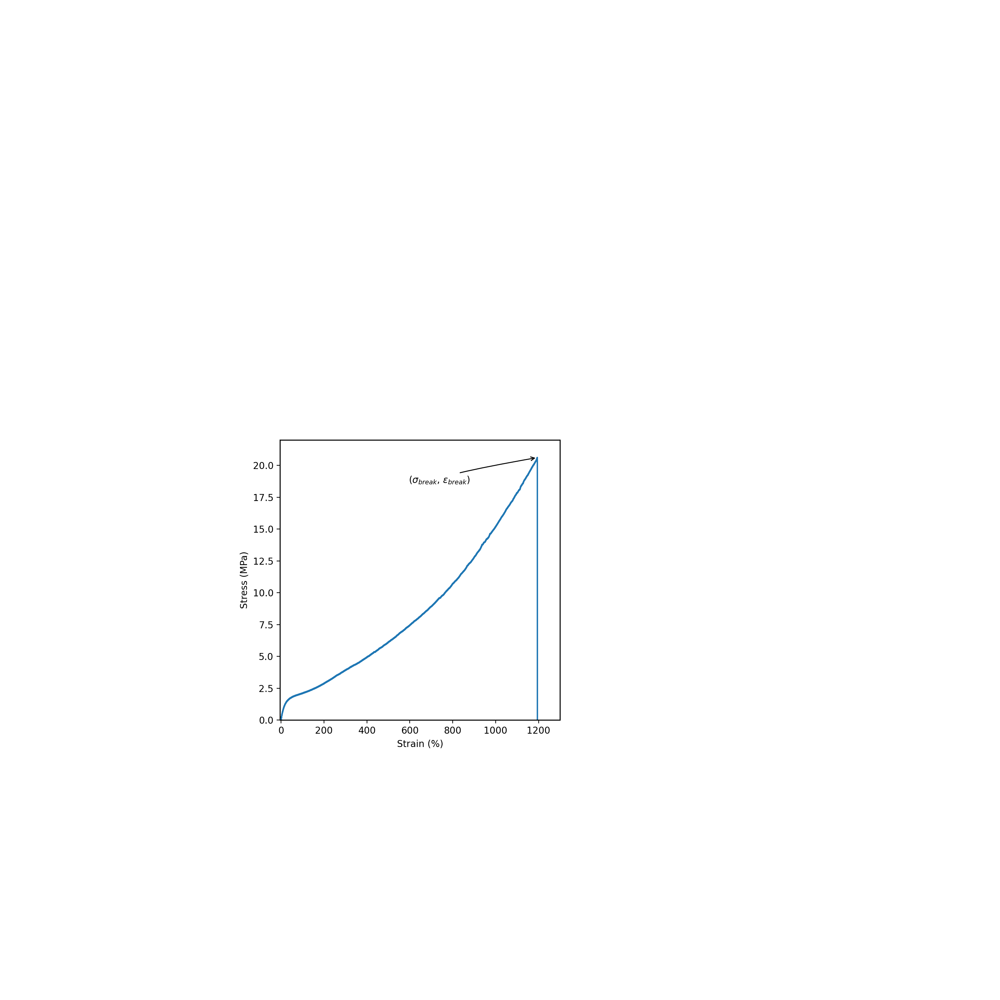

20.61967


In [29]:
%matplotlib inline
%matplotlib notebook 

# frame1 = plt.gca()
# fig, ax = plt.subplots()


fig = plt.figure(figsize=(15,15))
# ax = fig.add_subplot(111)
ax = fig.add_axes([0.28, 0.28, 0.28, 0.28])
# ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
params = {'legend.fontsize': 'x-Large',
#           'figure.figsize': (15, 5),
         'axes.labelsize': 'x-Large',
         'axes.titlesize':'x-Large',
         'xtick.labelsize':'x-LARGE',
         'ytick.labelsize':'x-LARGE'}
# frame1.axes.get_xaxis().set_ticks([1, 10000, 20000, 30000, 40000, 50000, 60000, 70000])
# frame1.axes.get_yaxis().set_ticks([1, 10000, 20000, 30000, 40000, 50000, 60000, 70000])
# plt.xticks(np.arange(min(x), max(x)+1, 100))


fig.subplots_adjust(
#     top=0.981,
#     bottom=0.0,
#     left=0.042,
#     right=0.981,
#     hspace=0,
#     wspace=0.2
)

### White backgoround
# rect = fig.patch
# rect.set_facecolor('white')

# ax = plt.axes()
# ax.set_facecolor("orange")

# plt.rcParams['axes.facecolor']='white'


# ax = fig.add_axes([0.1, 0.1, 0.3, 0.7])
max_y = max(y)
max_x = max(x)
# plt.axhline(0, color='gray', linestyle='-')
# plt.axvline(0, color='gray', linestyle='-')

# plt.hlines(y = max_y, xmin = 0, xmax = max_x, color = 'red', linestyle = 'dashed', linewidth = 1, label = 'Strees-break')
# plt.text(max_x/2, max_y -1, ' $σ_{break}$', ha='left', va='center')
print(max(y))

ax.yaxis.label.set_size(40)
plt.ylabel('Stress (MPa)', fontsize=10)
plt.xlabel('Strain (%)', fontsize=10)

# plt.text(max_x,max_y,'($σ_{break}$,$ε_{break}$)',horizontalalignment='right', fontsize=20)
ax.annotate('($σ_{break}$, $ε_{break}$)', xy=(max_x,max_y), xytext=(max_x - 600,max_y-2),
            arrowprops=dict(arrowstyle="->", color = 'black',
                            connectionstyle="angle3,angleA=90,angleB=10"), fontsize=10);

# We change the fontsize of minor ticks label 
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

ax.patch.set_edgecolor('black')  

ax.patch.set_linewidth('1')  
ax.margins(x=0.03, y=0.0)

ax.set_xlim(-5, 1300)
ax.set_ylim(0, 22)
# plt.axis('square')
# def set_xmargin(ax, left=0.0, right=0.3):
#     ax.set_xmargin(0)
#     ax.autoscale_view()
#     lim = ax.get_xlim()
#     delta = np.diff(lim)
#     left = lim[0] - delta*left
#     right = lim[1] + delta*right
#     ax.set_xlim(left,right)

# set_xmargin(ax, left=0, right=0.2)

# plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
# fig.subplots_adjust(bottom=0.8)
# plt.tight_layout(pad=0)
# ax.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5), ncol = 1)

plt.plot(x, y)
fig.savefig("stress-strain-plot.svg", format="svg", dpi=2400)

In [21]:
var = pd.read_excel("plots/DSC_GG437A_2.xlsx", engine='openpyxl')
# var[var < 0] = 0
print(var)
# var['Stroke_Strain'] = var['Stroke_Strain'].astype(float)
x = list(var['Temperature'])
y = list(var['Heat Flow (Normalized)'])

       Temperature  Heat Flow (Normalized)
0           -69.20                  -0.081
1           -69.18                  -0.081
2           -69.16                  -0.081
3           -69.15                  -0.081
4           -69.13                  -0.081
...            ...                     ...
16013       197.63                  -0.248
16014       197.65                  -0.248
16015       197.67                  -0.248
16016       197.68                  -0.248
16017       197.70                  -0.248

[16018 rows x 2 columns]


<IPython.core.display.Javascript object>


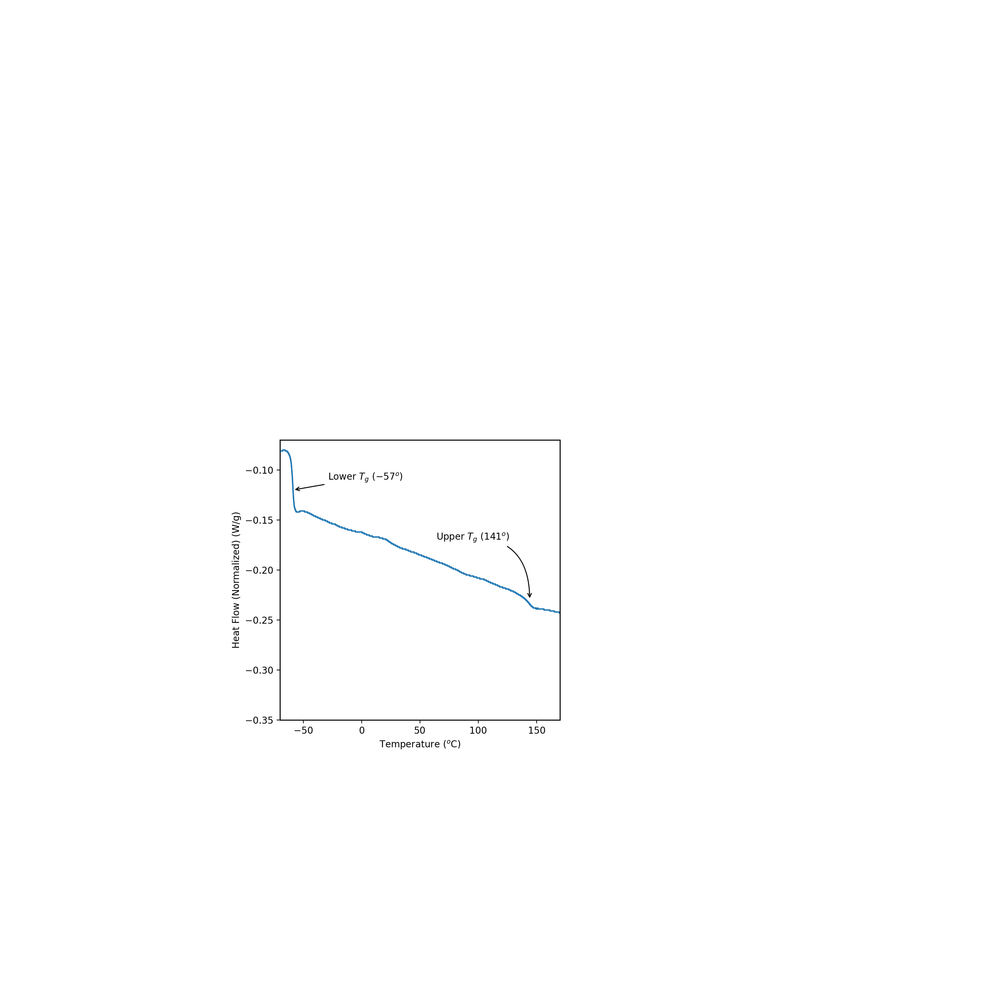

-0.08


In [25]:


# fig, ax = plt.subplots()



fig = plt.figure(figsize=(15,15))
# ax = fig.add_subplot(111)
ax = fig.add_axes([0.28, 0.28, 0.28, 0.28])
params = {'legend.fontsize': 'x-Large',
#           'figure.figsize': (15, 5),
         'axes.labelsize': 'x-Large',
         'axes.titlesize':'x-Large',
         'xtick.labelsize':'x-LARGE',
         'ytick.labelsize':'x-LARGE'}
# frame1.axes.get_xaxis().set_ticks([1, 10000, 20000, 30000, 40000, 50000, 60000, 70000])
# frame1.axes.get_yaxis().set_ticks([1, 10000, 20000, 30000, 40000, 50000, 60000, 70000])
# plt.xticks(np.arange(min(x), max(x)+1, 100))


fig.subplots_adjust(
#     top=0.981,
#     bottom=0.0,
#     left=0.042,
#     right=0.981,
#     hspace=0,
#     wspace=0.2
)

### White backgoround
# rect = fig.patch
# rect.set_facecolor('white')

# ax = plt.axes()
# ax.set_facecolor("orange")

# plt.rcParams['axes.facecolor']='white'


# ax = fig.add_axes([0.1, 0.1, 0.3, 0.7])
max_y = max(y)
max_x = max(x)
# plt.axhline(0, color='gray', linestyle='-')
# plt.axvline(0, color='gray', linestyle='-')

# plt.hlines(y = max_y, xmin = 0, xmax = max_x, color = 'red', linestyle = 'dashed', linewidth = 1, label = 'Strees-break')
# plt.text(max_x/2, max_y -1, ' $σ_{break}$', ha='left', va='center')
print(max(y))

ax.yaxis.label.set_size(40)
plt.ylabel('Heat Flow (Normalized) (W/g)', fontsize=10)
plt.xlabel('Temperature ($^{o}$C)', fontsize=10)

# plt.text(max_x,max_y,'($σ_{break}$,$ε_{break}$)',horizontalalignment='right', fontsize=20)
ax.annotate('Lower $T_g$ ($-57^o$)', xy=(-59,-0.12), xytext=(-54 + 25,-0.14 + 0.03),
            arrowprops=dict(arrowstyle="->", color = 'black',
                            connectionstyle="angle3,angleA=180,angleB=10"), fontsize=10);

ax.annotate('Upper $T_g$ ($141^o$)', xy=(144,-0.23), xytext=(60 + 4,-0.17),
            arrowprops=dict(arrowstyle="->", color = 'black',
                            connectionstyle="angle3,angleA=0,angleB=90"), fontsize=10);

# We change the fontsize of minor ticks label 
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

ax.patch.set_edgecolor('black')  

ax.patch.set_linewidth('1')  
ax.margins(x=0.03, y=0.5)
ax.set_xlim(-70, 170)
ax.set_ylim(-0.35, -0.07)
# ax.set_ylim(-10, 22)
# def set_xmargin(ax, left=0.0, right=0.3):
#     ax.set_xmargin(0)
#     ax.autoscale_view()
#     lim = ax.get_xlim()
#     delta = np.diff(lim)
#     left = lim[0] - delta*left
#     right = lim[1] + delta*right
#     ax.set_xlim(left,right)

# set_xmargin(ax, left=0, right=0.2)

# plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
# fig.subplots_adjust(bottom=0.8)
# plt.tight_layout(pad=0)
# ax.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5), ncol = 1)

plt.plot(x, y)
fig.savefig("DSC-plot.svg", format="svg", dpi=2400)

In [141]:
li = list(zip(x, y))

TypeError: 'value' must be an instance of str or bytes, not a float

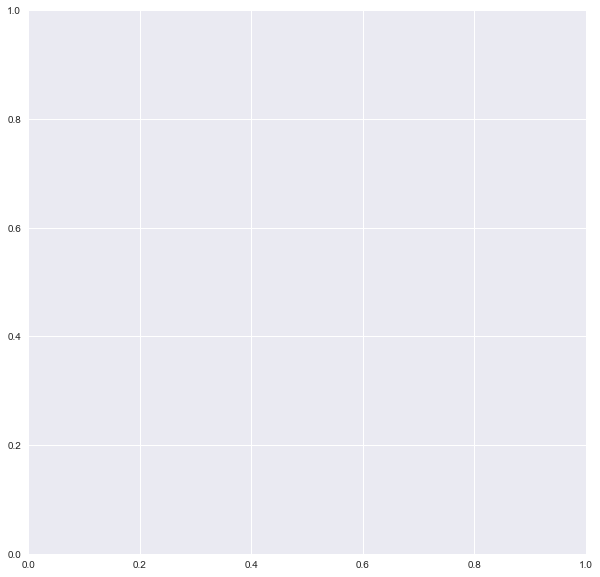

In [11]:
plt.figure(figsize=(10,10))
plt.style.use('seaborn')
plt.scatter(x,y,marker="*",s=100,edgecolors="black",c="yellow")
plt.title("Excel sheet to Scatter Plot")
plt.show()

In [179]:
import rdkit

In [180]:
# df = pd.read_excel('database17-fixingDLlactide.xlsx')
df = pd.read_excel('database19-fixing_acid_LO.xlsx')

#  We clean the data but do not change the slashed in block ratio. We also create another df with variances (zero if not reported)
df, df_var = cleanDataWithVariances(df, ['±', '/'], ['Block_ratio', 'Hard_block', 'Soft_block', 'ignore_row', 'sec', 'sterochemistry' ] )


df = df.infer_objects()
pd.set_option('display.max_rows', None)

df

C:\Users\engs2317\Dropbox\projects-PC\polymer-project-PC\polymer_regression_analysis.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col][number] = float(df[col][number])
C:\Users\engs2317\Dropbox\projects-PC\polymer-project-PC\polymer_regression_analysis.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_variances[col][number] = 0
C:\Users\engs2317\Dropbox\projects-PC\polymer-project-PC\polymer_regression_analysis.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

,Monomers,Hard_block,Soft_block,Big_Smile,Mn_(kg_mol),Block_ratio,pct_hard_segment,Dispersity,Tg,Tg2,Tm,Tc,E_(MPa),σbreak (MPa),εbreak (pct),X(T),Paper,ignore_row,sec,stereochemistry
0,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,29.2,31:157:31,31.000000,1.18,-43.0,29.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
1,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,33.4,45:159:45,39.000000,1.16,-43.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
2,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,35.2,50:162:50,41.000000,1.08,-42.0,38.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
3,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,46.0,93:151:93,58.000000,1.19,-44.0,42.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
4,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,60.0,144:145:144,69.000000,1.40,-55.0,33.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
5,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,80.0,203:169:203,73.000000,1.35,-44.0,48.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
6,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,26.0,50:91:50,55.000000,1.11,-41.0,39.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
7,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,35.2,67:124:67,55.000000,1.17,-42.0,43.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
8,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,90.0,181:295:181,58.000000,1.18,-45.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0
9,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,122.0,85:761:85,20.000000,1.18,-43.0,50.0,NaN,NaN,1.87,10.20,1880.0,61.2,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0


In [181]:
df_var

,Monomers,Hard_block,Soft_block,Big_Smile,Mn_(kg_mol),Block_ratio,pct_hard_segment,Dispersity,Tg,Tg2,Tm,Tc,E_(MPa),σbreak (MPa),εbreak (pct),X(T),Paper,ignore_row,sec,stereochemistry
0,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,31:157:31,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
1,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,45:159:45,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
2,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,50:162:50,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
3,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,93:151:93,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
4,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,144:145:144,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
5,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,203:169:203,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
6,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,50:91:50,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
7,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,67:124:67,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
8,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,181:295:181,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0
9,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,0.0,85:761:85,0.0,0.0,0.0,0.0,NaN,NaN,0.03,0.8,70.0,0.0,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,0.0


In [182]:
df['N_Tgs'] = df['Tg2'].isnull() + df['Tg'].isnull()
for row in range(len(df['Tg'])):
    if df['N_Tgs'][row] == False:
        df['N_Tgs'][row] = -1 # Means there are two Tgs
    else: 
        df['N_Tgs'][row] = 1 # Means that there is only one Tg value

df

C:\Users\engs2317\Anaconda3\envs\pol-env3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\engs2317\Anaconda3\envs\pol-env3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,Monomers,Hard_block,Soft_block,Big_Smile,Mn_(kg_mol),Block_ratio,pct_hard_segment,Dispersity,Tg,Tg2,...,Tc,E_(MPa),σbreak (MPa),εbreak (pct),X(T),Paper,ignore_row,sec,stereochemistry,N_Tgs
0,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,29.2,31:157:31,31.000000,1.18,-43.0,29.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
1,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,33.4,45:159:45,39.000000,1.16,-43.0,36.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
2,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,35.2,50:162:50,41.000000,1.08,-42.0,38.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
3,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,46.0,93:151:93,58.000000,1.19,-44.0,42.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
4,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,60.0,144:145:144,69.000000,1.40,-55.0,33.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
5,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,80.0,203:169:203,73.000000,1.35,-44.0,48.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
6,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,26.0,50:91:50,55.000000,1.11,-41.0,39.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
7,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,35.2,67:124:67,55.000000,1.17,-42.0,43.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
8,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,90.0,181:295:181,58.000000,1.18,-45.0,50.0,...,NaN,NaN,NaN,NaN,NaN,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1
9,"D,L lactide/6-methyl-ε-caprolactone","D,L lactide",6mεCL,{O[C@@H](C)C(=O)O[C@H](C)C(=O)}{OC(C)CCCCC(=O)...,122.0,85:761:85,20.000000,1.18,-43.0,50.0,...,NaN,1.87,10.20,1880.0,61.2,https://pubs.acs.org/doi/full/10.1021/ma201063t,NaN,NaN,1.0,-1


In [183]:
#  Identifying rows without block ratios. This will later be used to match the appropriate target property with its related polymer
rows_with_null_block_ratios = df['Block_ratio'].isnull()
print(rows_with_null_block_ratios)


rows_to_ignore = []

num_entries = len(df['Monomers'])
for row in range(num_entries):
#     if df['ignore_row'][row] == 1 or df['sterochemistry'][row] == 1:
    if df['ignore_row'][row] == 1:
        rows_to_ignore.append(row)

print(rows_to_ignore)     

# rows_to_also_ignore = [27,64, 86, 87, 88, 89, 90]
# rows_to_also_ignore = [27,64, 65,66,67,68, 86, 87, 88, 89, 90]
# rows_to_also_ignore = [27,64, 65,66,67,68]
rows_to_also_ignore = [27,64, 65,66,67,68, 86, 89, 90]
# rows_to_also_ignore = [27,64, 89]
# rows_to_also_ignore = []

# rows_to_also_ignore = [0,1,2,3,4, 79,80]
# rows_to_ignore = [14,15,27, 30, 45, 46]

rows_to_ignore = rows_to_ignore + rows_to_also_ignore

print(rows_to_ignore)


for r_to_ignore in rows_to_ignore:
    rows_with_null_block_ratios[r_to_ignore] = True
print(rows_with_null_block_ratios)    

smiles = df['Big_Smile']

# smiles = [strig]
# block_ratios = ['1:1:1']

block_ratios = df['Block_ratio']
print(block_ratios)


rows_with_stereo = [(df['stereochemistry'][row] == 1) for row in range(num_entries)]
# rows_with_stereo

CHIRALITY = True
HYDROGENS = False

full_pols = from_smiles_to_networkx(smiles, block_ratios, rows_with_null_block_ratios, rows_with_stereo, use_chiral = CHIRALITY, explicit_H = HYDROGENS)

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
34    False
35    False
36    False
37    False
38    False
39    False
40    False
41    False
42    False
43    False
44    False
45    False
46    False
47    False
48    False
49    False
50    False
51    False
52    False
53    False
54    False
55    False
56    False
57    False
58    False
59    False
60    False
61    False
62    False
63    False
64    False
65    False
66    False
67    False
68    False
69    False
70    False
71    False
72    False
73    False
74    False
75    False
76    False
77    False
78    False
79    False
80    False
81    False
82    False
83  

In [184]:
# Gettings names of polymers with no null block ratio
# names = df['Monomers']
names = df['Hard_block'].astype(str) +"/"+ df["Soft_block"]
print(names)
colours = ['black', 'lightcoral', 'sandybrown', 'indianred', 'brown', 'chocolate', 'gold', 'fuchsia', 'darkkhaki', 'olive', 'steelblue', 'darkorange','darkolivegreen','deepskyblue', 'tan', 'moccasin', 'orange','red', 'gold', 'darkkhaki', 'olive', 'forestgreen', 'skyblue', 'rebeccapurple', 'yellow', 'yellowgreen', 'greenyellow', 'chartreuse', 'lawngreen', 'honeydew', 'darkseagreen', 'palegreen', 'lightgreen', 'forestgreen', 'skyblue', 'rebeccapurple', 'limegreen', 'darkgreen', 'green', 'lime', 'seagreen', 'mediumseagreen', 'springgreen', 'mintcream', 'mediumspringgreen', 'mediumaquamarine', 'aquamarine', 'turquoise', 'lightseagreen', 'mediumturquoise', 'azure', 'lightcyan', ]
# colours = ['black', 'lightcoral', 'indianred', 'brown', 'firebrick', 'maroon', 'darkred', 'red', 'mistyrose', 'salmon', 'tomato', 'darksalmon', 'coral', 'orangered', 'lightsalmon', 'sienna', 'seashell', 'chocolate', 'saddlebrown', 'sandybrown', 'peachpuff', 'peru', 'linen', 'bisque', 'darkorange', 'burlywood', 'tan', 'papayawhip', 'moccasin', 'orange', 'wheat', 'oldlace', 'darkgoldenrod', 'goldenrod', 'cornsilk', 'gold', 'lemonchiffon', 'darkkhaki', 'lightyellow', 'lightgoldenrodyellow', 'olive', 'yellow', 'olivedrab', 'yellowgreen', 'darkolivegreen', 'greenyellow', 'chartreuse', 'lawngreen', 'honeydew', 'darkseagreen', 'palegreen', 'lightgreen', 'forestgreen', 'limegreen', 'darkgreen', 'green', 'lime', 'seagreen', 'mediumseagreen', 'springgreen', 'mintcream', 'mediumspringgreen', 'mediumaquamarine', 'aquamarine', 'turquoise', 'lightseagreen', 'mediumturquoise', 'azure', 'lightcyan', 'paleturquoise', 'darkslategray', 'darkslategrey', 'teal', 'darkcyan', 'aqua', 'cyan', 'darkturquoise', 'cadetblue', 'powderblue', 'lightblue', 'deepskyblue', 'skyblue', 'lightskyblue', 'steelblue', 'aliceblue', 'dodgerblue', 'lightslategray', 'lightslategrey', 'slategray', 'slategrey', 'lightsteelblue', 'cornflowerblue', 'royalblue', 'ghostwhite', 'lavender', 'midnightblue', 'navy', 'darkblue', 'mediumblue', 'blue', 'slateblue', 'darkslateblue', 'mediumslateblue', 'mediumpurple', 'rebeccapurple', 'blueviolet', 'indigo', 'darkorchid', 'darkviolet', 'mediumorchid', 'thistle', 'plum', 'violet', 'purple', 'darkmagenta', 'fuchsia', 'magenta', 'orchid', 'mediumvioletred', 'deeppink', 'hotpink', 'lavenderblush', 'palevioletred', 'crimson', 'pink', 'lightpink']


name_to_colour_dict = dict()
counter = 0
for name in names:
    if name not in name_to_colour_dict.keys():
        name_to_colour_dict[name] = colours[counter]
        counter += 1 
print(name_to_colour_dict)
    
polymer_names = []
polymer_numbers = []
polymer_colours = []
for counter in range(len(names)):
    if len(rows_with_null_block_ratios) != 0:
        if rows_with_null_block_ratios[counter]:
            continue
    polymer_names.append(names[counter]) 
    polymer_numbers.append(counter) 
    polymer_colours.append(name_to_colour_dict[names[counter]])

print(polymer_numbers)
polymer_names

0        D,L lactide/6mεCL
1        D,L lactide/6mεCL
2        D,L lactide/6mεCL
3        D,L lactide/6mεCL
4        D,L lactide/6mεCL
5        D,L lactide/6mεCL
6        D,L lactide/6mεCL
7        D,L lactide/6mεCL
8        D,L lactide/6mεCL
9        D,L lactide/6mεCL
10       D,L lactide/6mεCL
11    D,L lactide/menthide
12    D,L lactide/menthide
13      L lactide/menthide
14      D lactide/menthide
15      L lactide/menthide
16      D lactide/menthide
17      L lactide/menthide
18      D lactide/menthide
19         L lactide/SA/PD
20         L lactide/SA/PD
21         L lactide/SA/PD
22         L lactide/SA/PD
23         L lactide/4mεCL
24         L lactide/4mεCL
25         L lactide/4mεCL
26         L lactide/4mεCL
27         L lactide/4mεCL
28       D,L lactide/4mεCL
29         L lactide/4mεCL
30     D,L lactide/εCL/εDL
31     D,L lactide/εCL/εDL
32     D,L lactide/εCL/εDL
33     D,L lactide/εCL/εDL
34         D,L lactide/εDL
35         D,L lactide/εDL
36         D,L lactide/εDL
3

['D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/6mεCL',
 'D,L lactide/menthide',
 'D,L lactide/menthide',
 'L lactide/menthide',
 'D lactide/menthide',
 'L lactide/menthide',
 'D lactide/menthide',
 'L lactide/menthide',
 'D lactide/menthide',
 'L lactide/SA/PD',
 'L lactide/SA/PD',
 'L lactide/SA/PD',
 'L lactide/SA/PD',
 'L lactide/4mεCL',
 'L lactide/4mεCL',
 'L lactide/4mεCL',
 'L lactide/4mεCL',
 'D,L lactide/4mεCL',
 'L lactide/4mεCL',
 'D,L lactide/εCL/εDL',
 'D,L lactide/εCL/εDL',
 'D,L lactide/εCL/εDL',
 'D,L lactide/εCL/εDL',
 'D,L lactide/εDL',
 'D,L lactide/εDL',
 'D,L lactide/εDL',
 'L lactide/βMδVL',
 'L lactide/βMδVL',
 'L lactide/βMδVL',
 'L lactide/βMδVL',
 'L lactide/βMδVL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO PA/εDL',
 'CHO P

In [185]:
monomers_df = pd.read_excel('monomers with smiles and structures(1).xlsx')
monomers_df

,Monomer,SMILES,Hard_Block,Molar_mass,aka,old_names,Comments
0,"D,L lactide",O[C@@H](C)C(=O)O[C@H](C)C(=O),1,144.12,"rac-PLA, PLA","D,L lactide",was OC(C)C(=O)OC(C)C(=O)
1,6mεCL,OC(C)CCCCC(=O),0,128.17,"eHL, 6meCL",6-methyl-ε-caprolactone,NaN
2,menthide,O[C@H](C(C)C)CC[C@@H](C)CC(=O),0,170.24,NaN,menthide,There was a closing squared bracked missing. C...
3,L lactide,O[C@@H](C)C(=O)O[C@@H](C)C(=O),1,144.12,NaN,L lactide,Changed from OC[C@@H](C)C(=O)O[C@H](C)C(=O). ...
4,D lactide,O[C@H](C)C(=O)O[C@H](C)C(=O),1,144.12,NaN,D lactide,Changed from OC[C@H](C)C(=O)O[C@@H](C)C(=O). T...
5,SA/PD,OCC(C)COC(=O)CCC(=O),0,176.16,"2-methyl-1,3-propane diol/ succinic acid",succinic acid_propane diol,NaN
6,4mεCL,OCCC(C)CCC(=O),0,128.17,"gamma methyl epsilon caprolactone, gmeCL, 4meCL",4-methyl-ε-caprolactone,NaN
7,εCL,OCCCCCC(=O),0,114.14,eCL,epsilon caprolactone,NaN
8,εDL,OC(CCCC)CCCCC(=O),0,170.24,PDL,epsilon decalactone,NaN
9,βMδVL,OCCC(C)CC(=O),0,114.15,NaN,βMδVL,NaN


In [186]:
# To check before 15th July 2022:
# Hard: 
# 16 : PA CHO
# 19: PA vCHO
# 21 : PA acid vCHO
# [PA CHO, PA vCHO, PA acid vCHO]
# Soft:
# 22:  PTMC
# 6 : 4-methyl-ε-caprolactone
# 8 : epsilon decalactone
# 1 : 6-methyl-ε-caprolactone
# [4-methyl-ε-caprolactone,  epsilon decalactone, 6-methyl-ε-caprolactone]

In [187]:
# Creating dict of whether a monomer is part of the hard block
is_hard_block = dict(zip(monomers_df.Monomer, monomers_df.Hard_Block))
print(is_hard_block)

# Creating dict of polymer SMILEs
smiles_of_monomer = dict(zip(monomers_df.Monomer, monomers_df.SMILES))
print(smiles_of_monomer)

# Creating dict of polymer molar mass
molar_mass_of_monomer = dict(zip(monomers_df.Monomer, monomers_df.Molar_mass))
print(molar_mass_of_monomer)

{'D,L lactide': 1, '6mεCL': 0, 'menthide': 0, 'L lactide': 1, 'D lactide': 1, 'SA/PD': 0, '4mεCL': 0, 'εCL': 0, 'εDL': 0, 'βMδVL': 0, 'CHO': 1, 'PA': 1, 'αmγBL': 1, 'δVL': 0, 'isoprene': 0, 'εCL/εDL': 0, 'CHO PA': 1, 'PA CHO': 1, 'εCL/δVL': 0, 'vCHO': 1, 'vCHO PA': 1, 'PA vCHO': 1, 'acid vCHO': 1, 'acid vCHO PA': 1, 'PA acid vCHO': 1, 'TMC': 0, 'TCA2': 1, 'TCA2 CHO': 1, 'CO2': 1, 'CO2 vCHO': 1, 'CO2 acid vCHO': 1, 'LO ': 1, 'acid LO': 1, 'PA LO': 1, 'LO PA': 1, 'acid LO PA': 1, 'MO': 1, 'CHDO': 1, 'MO PA': 1, 'CHDO PA': 1}
{'D,L lactide': 'O[C@@H](C)C(=O)O[C@H](C)C(=O)', '6mεCL': 'OC(C)CCCCC(=O)', 'menthide': 'O[C@H](C(C)C)CC[C@@H](C)CC(=O)', 'L lactide': 'O[C@@H](C)C(=O)O[C@@H](C)C(=O)', 'D lactide': 'O[C@H](C)C(=O)O[C@H](C)C(=O)', 'SA/PD': 'OCC(C)COC(=O)CCC(=O)', '4mεCL': 'OCCC(C)CCC(=O)', 'εCL': 'OCCCCCC(=O)', 'εDL': 'OC(CCCC)CCCCC(=O)', 'βMδVL': 'OCCC(C)CC(=O)', 'CHO': 'Oc1C(CCCC1)', 'PA': 'OC(=O)C1=CC=CC=C1C(=O)', 'αmγBL': 'C1(C(=O)OCC1)C', 'δVL': 'OCCCCC(=O)', 'isoprene': 'CC=C(C

In [188]:
# SHANNON's 1st New POlymer

# Creating extra polymers to test
# combination_of_repeat_units = df['Big_Smile'][0]  # Using this one for testing

# vCHO = 'Oc1c(cc(C=C)cc1)'
# TCA1 = 'OC(=O)C1C(C=O)C2C=C(C)C1CC2C(C)C'
# four_methyl_caprolactone = 'OCCC(C)CCC(=O)'
# six_methyl_caprolactone = 'OC(C)CCCCC(=O)'

# combination_of_repeat_units = '{' + vCHO + TCA1 + '}{' + six_methyl_caprolactone + '}{' + vCHO + TCA1 + '}'
# print(combination_of_repeat_units)

# combination_of_repeat_units =   '{Oc1C(CC(C=C)CC1)OC(=O)c1ccccc1C(=O)}{OCCC(C)CCC(=O)}{Oc1C(CC(C=C)CC1)OC(=O)c1ccccc1C(=O)}'




        
# test_smiles = [combination_of_repeat_units, combination_of_repeat_units] 
# block_ratios_to_test = ['19:675:19', '38:475:38']
# null_ratios = [False, False]



# print(block_ratios_to_test)
# full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios)
# full_pols_test

In [189]:
# # Creating extra polymers to test
# # combination_of_repeat_units = df['Big_Smile'][0]  # Using this one for testing

# vCHO = 'Oc1c(cc(C=C)cc1)'
# TCA1 = 'OC(=O)C1C(C=O)C2C=C(C)C1CC2C(C)C'
# four_methyl_caprolactone = 'OCCC(C)CCC(=O)'
# six_methyl_caprolactone = 'OC(C)CCCCC(=O)'

# combination_of_repeat_units = '{' + vCHO + TCA1 + '}{' + six_methyl_caprolactone + '}{' + vCHO + TCA1 + '}'
# print(combination_of_repeat_units)

# # hard_blocks = 70
# # soft_blocks = 700
# hard_blocks = 20
# soft_blocks = 30


# test_smiles = [] 
# block_ratios_to_test = []
# null_ratios = []
# for i in range(10, hard_blocks, 10):
#     for j in range(2, soft_blocks, 100):
#         block_ratios_to_test.append(str(i) + ':' + str(j) + ':' + str(i))
#         test_smiles.append(combination_of_repeat_units)
#         null_ratios.append(False)
# print(block_ratios_to_test)
# full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios)
# full_pols_test

In [190]:
from grakel.utils import graph_from_networkx

#  Transforming networkX graphs into grakel graphs. 
grakel_pols = graph_from_networkx(full_pols, node_labels_tag='element', edge_weight_tag ='order', as_Graph = False)


#  Getting a list of them rather than an itearable. 

# G = grakel_pols
Graphs = []
for g in grakel_pols:
    Graphs.append(g)
Graphs

[[{0: {1: 1.0},
   1: {0: 1.0, 2: 1.0, 3: 1.0},
   2: {1: 1.0},
   3: {1: 1.0, 4: 2.0, 5: 1.0},
   4: {3: 2.0},
   5: {3: 1.0, 6: 1.0},
   6: {5: 1.0, 7: 1.0, 8: 1.0},
   7: {6: 1.0},
   8: {6: 1.0, 9: 2.0, 10: 1.0},
   9: {8: 2.0},
   10: {8: 1.0, 11: 1.0},
   11: {10: 1.0, 12: 1.0, 13: 1.0},
   12: {11: 1.0},
   13: {11: 1.0, 14: 2.0, 15: 1.0},
   14: {13: 2.0},
   15: {13: 1.0, 16: 1.0},
   16: {15: 1.0, 17: 1.0, 18: 1.0},
   17: {16: 1.0},
   18: {16: 1.0, 19: 2.0, 20: 1.0},
   19: {18: 2.0},
   20: {18: 1.0, 21: 1.0},
   21: {20: 1.0, 22: 1.0, 23: 1.0},
   22: {21: 1.0},
   23: {21: 1.0, 24: 2.0, 25: 1.0},
   24: {23: 2.0},
   25: {23: 1.0, 26: 1.0},
   26: {25: 1.0, 27: 1.0, 28: 1.0},
   27: {26: 1.0},
   28: {26: 1.0, 29: 2.0, 30: 1.0},
   29: {28: 2.0},
   30: {28: 1.0, 31: 1.0},
   31: {30: 1.0, 32: 1.0, 33: 1.0},
   32: {31: 1.0},
   33: {31: 1.0, 34: 2.0, 35: 1.0},
   34: {33: 2.0},
   35: {33: 1.0, 36: 1.0},
   36: {35: 1.0, 37: 1.0, 38: 1.0},
   37: {36: 1.0},
   38: {36: 

### For Extra Tests

In [ ]:
# Creating extra polymers to test
# combination_of_repeat_units = df['Big_Smile'][0]  # Using this one for testing

# h_block = 'PA CHO'
# s_block = '6-methyl-ε-caprolactone'

for h_block in ['PA CHO', 'PA vCHO', 'PA acid vCHO']:
    break_after_this = False # To break vefore the end. 
    if is_hard_block[h_block] == 0: # Check if it is hard block. If not, go to next. 
        continue
    for s_block in ['4-methyl-ε-caprolactone',  'epsilon decalactone', '6-methyl-ε-caprolactone', 'PTMC']:
        if is_hard_block[s_block] == 1: # Check if it is soft block. If not, go to next.
            continue

        h_block = 'PA vCHO'
        s_block = 'PTMC'

#         h_block = 'PA CHO'
#         s_block = 'PTMC'
        
#         h_block = 'PA CHO'
#         s_block = 'epsilon decalactone'
        
        break_after_this_combination = True
        
        print('Soft Block:', s_block, ' ', smiles_of_monomer[s_block])
        print('Hard Block:', h_block, ' ', smiles_of_monomer[h_block])
        #     combination_of_repeat_units = '{' + smiles_of_monomer[h_block] + '}{' + smiles_of_monomer[s_block] + '}{' + smiles_of_monomer[h_block] + '}'

        combination_of_repeat_units = '{' + smiles_of_monomer[h_block] + '}{' + smiles_of_monomer[s_block] + '}{' + smiles_of_monomer[h_block] + '}'

        print(combination_of_repeat_units)

        # hard_blocks = 25  # These are the outer blocks
        # soft_blocks = 110  # These are the inner blocks

        hard_blocks = 150  # These are the outer blocks
        soft_blocks = 1200  # These are the inner blocks
        

        # test_smiles = [combination_of_repeat_units, combination_of_repeat_units] 
        # block_ratios_to_test = ['19:675:19', '38:475:38']
        # null_ratios = [False, False]

        need_stereo = False
        
        test_smiles = [] 
        block_ratios_to_test = []
        null_ratios = []
        rows_with_stereo_for_this_monomer_combination = []
        for i in range(10, hard_blocks, 10):
            for j in range(50, soft_blocks, 50):
                block_ratios_to_test.append(str(i) + ':' + str(j) + ':' + str(i))
                test_smiles.append(combination_of_repeat_units)
                null_ratios.append(False)
                rows_with_stereo_for_this_monomer_combination.append(need_stereo)
        # print(block_ratios_to_test)


        print(">>> Getting Full Polymer for ", h_block, " and, ", s_block)
        param = str(h_block) +  str(s_block) +  str(hard_blocks) +  str(soft_blocks) + str(len(block_ratios_to_test))
        try:
            full_pols_test = pickle.load(open('{0}.pickle'.format(param), "rb"))
            print(">>>> Pickle found")
        except (OSError, IOError) as e:
            print(">>>> Pickle not found, recomputing")
            full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios, rows_with_stereo_for_this_monomer_combination, use_chiral = CHIRALITY)
            pickle.dump(full_pols_test, open('{0}.pickle'.format(param), "wb"))

        # print(block_ratios_to_test)
        # full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios)
        if break_after_this_combination:
            break
    if break_after_this_combination:
        break
full_pols_test

In [ ]:
# grakel_pols = graph_from_networkx(full_pols, node_labels_tag='element', edge_weight_tag ='order', as_Graph = False)
grakel_pols_extra = graph_from_networkx(full_pols_test, node_labels_tag='element', edge_weight_tag ='order', as_Graph = False)


#  Getting a list of them rather than an itearable. 

# G = grakel_pols
Graphs_extra = []
for g in grakel_pols_extra:
    Graphs_extra.append(g)
Graphs_extra

In [ ]:
len(Graphs_extra)

### Defining targets

In [191]:
targets = []
for t in df:
    if t not in ['Monomers', 'Hard_block', 'Soft_block', 'Big_Smile', 'Block_ratio','Paper']:
        targets.append(t)
targets

['Mn_(kg_mol)',
 'pct_hard_segment',
 'Dispersity',
 'Tg',
 'Tg2',
 'Tm',
 'Tc',
 'E_(MPa)',
 'σbreak (MPa)',
 'εbreak (pct)',
 'X(T)',
 'ignore_row',
 'sec',
 'stereochemistry',
 'N_Tgs']

In [192]:
from sklearn.model_selection import train_test_split
# import sklearn
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import sklearn
import sklearn.ensemble 

In [193]:
from grakel.kernels import (
    GraphletSampling,
    RandomWalk,
    RandomWalkLabeled,
    ShortestPath,
    ShortestPathAttr,
    WeisfeilerLehman,
    WeisfeilerLehmanOptimalAssignment,
    NeighborhoodHash,
    PyramidMatch,
    SubgraphMatching,
    NeighborhoodSubgraphPairwiseDistance,
    LovaszTheta,
    SvmTheta,
    OddSth,
    Propagation,
    PropagationAttr,
    HadamardCode,
    MultiscaleLaplacian,
    VertexHistogram,
    EdgeHistogram,
    GraphHopper,
)

In [194]:
# N_JOBS is for paralelisation of kernel evaluation
N_JOBS = None

NORMALIZING_GRAPH_KERNELS = True


GRAKEL_KERNELS = {
    "SPath": lambda: ShortestPath(normalize=NORMALIZING_GRAPH_KERNELS),
    "VHist": lambda: VertexHistogram(normalize=NORMALIZING_GRAPH_KERNELS),
    "GSamp": lambda: GraphletSampling(normalize=NORMALIZING_GRAPH_KERNELS),
    "WL-1": lambda: WeisfeilerLehman(
        n_iter=1, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-2": lambda: WeisfeilerLehman(
        n_iter=2, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-3": lambda: WeisfeilerLehman(
        n_iter=3, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-4": lambda: WeisfeilerLehman(
        n_iter=4, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-5": lambda: WeisfeilerLehman(
        n_iter=5, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-6": lambda: WeisfeilerLehman(
        n_iter=6, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-1": lambda: WeisfeilerLehmanWithMultipleBonds(
        n_iter=1, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-2": lambda: WeisfeilerLehmanWithMultipleBonds(
        n_iter=2, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-3": lambda: WeisfeilerLehmanWithMultipleBonds(
        n_iter=3, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-4": lambda: WeisfeilerLehmanWithMultipleBonds(
        n_iter=4, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-5": lambda: WeisfeilerLehmanWithMultipleBonds(
        n_iter=5, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-6": lambda: WeisfeilerLehmanWithMultipleBonds(
    n_iter=6, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-7": lambda: WeisfeilerLehmanWithMultipleBonds(
    n_iter=7, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-10": lambda: WeisfeilerLehmanWithMultipleBonds(
    n_iter=10, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-20": lambda: WeisfeilerLehmanWithMultipleBonds(
    n_iter=20, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WLB-40": lambda: WeisfeilerLehmanWithMultipleBonds(
    n_iter=40, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "NH": lambda: NeighborhoodHash(
        n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-1": lambda: HadamardCode(
        n_iter=1, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-2": lambda: HadamardCode(
        n_iter=2, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-3": lambda: HadamardCode(
        n_iter=3, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-4": lambda: HadamardCode(
        n_iter=4, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-5": lambda: HadamardCode(
        n_iter=5, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "HC-6": lambda: HadamardCode(
    n_iter=6, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    # There are no edge-labels
#     "NSPD": lambda: NeighborhoodSubgraphPairwiseDistance(
#         normalize=NORMALIZING_GRAPH_KERNEL
#     ),
    "WL-OA-1": lambda: WeisfeilerLehmanOptimalAssignment(
        n_iter=1, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-2": lambda: WeisfeilerLehmanOptimalAssignment(
        n_iter=2, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-3": lambda: WeisfeilerLehmanOptimalAssignment(
        n_iter=3, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-4": lambda: WeisfeilerLehmanOptimalAssignment(
        n_iter=4, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-5": lambda: WeisfeilerLehmanOptimalAssignment(
        n_iter=5, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-6": lambda: WeisfeilerLehmanOptimalAssignment(
    n_iter=6, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-7": lambda: WeisfeilerLehmanOptimalAssignment(
    n_iter=7, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-8": lambda: WeisfeilerLehmanOptimalAssignment(
    n_iter=8, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-20": lambda: WeisfeilerLehmanOptimalAssignment(
    n_iter=20, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "WL-OA-40": lambda: WeisfeilerLehmanOptimalAssignment(
    n_iter=40, n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "MS_Laplacian": lambda: MultiscaleLaplacian(
    n_jobs=N_JOBS, normalize=NORMALIZING_GRAPH_KERNELS
    ),
    "OddSth": lambda: OddSth(normalize=NORMALIZING_GRAPH_KERNELS),
#     "RUnits": lambda: create_repeat_units_feature_vectors(),
    "RUnits": lambda: (),
}


In [195]:
from sklearn.decomposition import PCA
from sklearn import linear_model
import pysmiles
import csv  

def restrict_list_of_graphs_based_on_non_null_targets(rows_of_block_ratios, graphs, target):
    
    provisory_y = []
    final_y = []
    final_G = [] # Where the graphs associated to non-null entries y will be added to. 
    #  This checks y entries for the non-null block_ration entries. The y entries can be null for now. 
    for counter in range(len(rows_with_null_block_ratios)):
        if rows_with_null_block_ratios[counter]:
            continue
        provisory_y.append(float((target[counter])))
    #  This now checks entries of y against the non-null entries of block ratio. 
    #  A new graphs vector will be created based on the non-null values of y
    y_is_null = np.isnan(provisory_y)
    for i in range(len(y_is_null)):
        if y_is_null[i]:
            continue
        final_y.append(provisory_y[i])
        final_G.append(graphs[i])
        
    return final_G, final_y


def create_repeat_units_feature_vectors():
    smiles = df['Big_Smile']
    block_ratios = df['Block_ratio']
    repeat_unit_dict = generate_dictionary_of_repeat_units(smiles)
    return from_smiles_to_repeat_units(smiles, block_ratios, rows_with_null_block_ratios, repeat_unit_dict)

def generate_explanations_and_subgraphs(exp, gk, importance_order, i, d, index_of_tests, index_of_train):
    if importance_order == 0:  
        exp.show_in_notebook(show_table=True)
        print(exp.as_list())
    
    print(exp.as_list()[importance_order])
    pattern, change = split_explanation(exp.as_list()[importance_order])
    print(pattern)
    print(change)
    found_in_test_graphs = False
    found_in_train_graphs = False
    graph_where_pattern_was_found = None
    print("index of tests: ", index_of_tests)
    for test_graph in index_of_tests:
        if found_in_test_graphs:
            break
        for node in gk._patterns[d][test_graph]:
#             print(pattern)
#             print(gk._patterns[d][test_graph][node])
            if pattern == gk._patterns[d][test_graph][node]:
                print(pattern)
                print(gk._patterns[d][test_graph][node])
                print('Found')
                found_in_test_graphs = True
                graph_where_pattern_was_found = test_graph
                print(node)
                print(test_graph)
                break
    if not found_in_test_graphs:
        print("pattern not found in test graphs")
    for train_graph in index_of_train:
        if found_in_test_graphs:
            break
        if found_in_train_graphs:
            break
        for node in gk._patterns[d][train_graph]:
#             print(pattern)
#             print(gk._patterns[d][test_graph][node])
            if pattern == gk._patterns[d][train_graph][node]:
                print(pattern)
                print(gk._patterns[d][train_graph][node])
#                 print('Found')
                found_in_train_graphs = True
                graph_where_pattern_was_found = train_graph
                print(node)
                print(train_graph)
                break
    if not found_in_train_graphs:
        print("pattern not found in train graphs")
    return node, graph_where_pattern_was_found, pattern, found_in_test_graphs, change

def generate_networkx_subgraph_from_grakel_graph_node_and_depth(gr, depth, starting_node):
    subgraph = nx.Graph()
    # depth = 2
    queue = []
    # queue.append(13)
    queue.append(starting_node)
    # print(gr[0])
    for d in range(depth):
        n_nodes_to_add = len(queue) # To make sure we don't add neighbours of neighbours at this depth. 
        for i in range(n_nodes_to_add):
            new_node = queue.pop(0)
    #         print(gr[0][queue.pop(0)])
            if new_node not in list(subgraph.nodes):
                subgraph.add_node(new_node, element= gr[1][new_node])
#             print(gr[0][new_node])
            for neigh, weight in gr[0][new_node].items():
                if neigh not in list(subgraph.nodes):
                    subgraph.add_node(neigh, element= gr[1][neigh])
                    queue.append(neigh)
                subgraph.add_edge(new_node, neigh, order = weight)
    return subgraph

def defining_learning_method(targ, l_met, weight_y_data_train, weight_y_data_train_tg_tg2, y_var_data_train):
    if l_met == 'rf':
        met = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
    if l_met == 'ard':
        met = linear_model.ARDRegression()
    if l_met == 'bayes':
        met = linear_model.BayesianRidge()
    if l_met == 'gp-scikit':
#         kernel = 5*DotProduct(1, sigma_0_bounds = (10  **(-2), 10 **1 ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-2), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-2), 3*10 **1 )) #+ Matern()
#         kernel = 5*DotProduct(1, sigma_0_bounds = (10  **(-3), 10 **3 ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-4), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) #+ Matern()
        kernel = DotProduct(1, sigma_0_bounds = (10  **(-2), 10 **3 ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-4), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) #+ Matern()
#         kernel = 1*DotProduct(1, sigma_0_bounds = (10  **(-3), 10 **3 )) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) # + Matern()
        # Fixing noise for Tg and Tg2 to a fixed value:
        if t == 'Tg' or t == 'Tg2':
            y_var_data_train = np.where(y_var_data_train == 0, weight_y_data_train_tg_tg2, y_var_data_train)
        elif t in ['E_(MPa)', 'σbreak (MPa)', 'εbreak (pct)']:
            y_var_data_train = weight_y_data_train * y_var_data_train
        met = GaussianProcessRegressor(kernel=kernel, random_state=0, alpha = np.square(y_var_data_train), normalize_y=True, n_restarts_optimizer=5)
    return met
    
def corr2_coeff(A, B):
    # Rowwise mean of input arrays & subtract from input arrays themeselves
    A_mA = A - A.mean(1)[:, None]
    B_mB = B - B.mean(1)[:, None]

    # Sum of squares across rows
    ssA = (A_mA**2).sum(1)
    ssB = (B_mB**2).sum(1)

    # Finally get corr coeff
    return np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))

def add_row_to_csv_file_of_smiles(new_row, file_name, is_first_row):
    with open(file_name, 'a') as f:
        # check if file em empty, if it is, add title columns
        writer = csv.writer(f)
        if is_first_row: 
            writer.writerow(['change', 'smiles'])
        writer.writerow(new_row)
    
def run_kernels_against_target(df, 
                               target, 
                               target_var, 
                               graphs, 
                               number_of_runs, 
                               kernels = ["WL-4"], 
                               learning_met = 'rf', 
                               error = 'mean_sq', 
                               normalise = True, 
                               explicit_features = False,
                               explanation = False,
                               extra_tests = [],
                               visualisation = False,
                               show_error_bars = False,
                              training_error = False,
                               weight_y_var_train = 1,
                               weight_y_var_train_for_tg_and_tg2 = 1,
                               truncate_to_zero_if_neg = True,
                              log_y = True, 
                              printing_results = False,
                              with_shortest_paths = False,
                              n_shortest_paths_features = 50,
                              RFE_selection = False,
                              RFE_selection_n_features = 50,
                              covar_feature_selection = False,
                               concatenate_depths = False):
    means = []
    stds = []
    size_of_test = 0.1
    runs_for_plot = round((1 / size_of_test) + 1, 0)
    
    G, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, graphs, target)
    G, y_var = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, graphs, target_var)
    if len(y) != len(y_var):
        print("Lenght of y and y_var are not the same")
    if len(G) != len(y):
        print("Lenght of G and y are not the same")    
    # Same function also works for restricting the list of polymer names and numbers. 
    names_of_polymers, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, polymer_names, target)
    numbers_of_polymers, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, polymer_numbers, target)
    colours_of_polymers, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, polymer_colours, target) 
    if with_shortest_paths:
        features_shortest_paths, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, features_sp[:, 0:n_shortest_paths_features], target)
    if len(y) != len(y_var):
        print("Lenght of y and y_var are not the same")
    if len(G) != len(y):
        print("Lenght of G and y are not the same")    
    
    if len(extra_tests) != 0: 
        G_extra_tests = extra_tests
        
    if "RUnits" in kernels:
        feature_vectors_repeat_units = create_repeat_units_feature_vectors()
        G_repeat_units, y = restrict_list_of_graphs_based_on_non_null_targets(rows_with_null_block_ratios, feature_vectors_repeat_units, target)
    
    print("> Number of data points for", t, "is", len(y))
    print("> With shortest paths = ", with_shortest_paths)
    print("> With concatenate depth = ", concatenate_depths)
    if normalise:
        normalised_y = pd.DataFrame(y) # normalising y
        normalise_standard(normalised_y)
        y = normalised_y.to_numpy().ravel()
        
        # We don't normalise the variance vector
        y_var = np.array(y_var).ravel()

        
    else:
        y = np.array(y).ravel()
        y_var = np.array(y_var).ravel()
    
    
        
    for ker in kernels:
        print(">> Testing GraKeL kernel:", ker)
        mean_sq_error = []
        mean_sq_training_error = []
        for run in range(number_of_runs):
            # Setting up the slices for kfold
            indices = range(len(G))

#                     n_splits = 10
            n_splits = len(G)
            kfold = KFold(n_splits=n_splits, shuffle=True, random_state=run+1)

            concatenated_y_training_pred = ()
            concatenated_y_training_real = ()
            concatenated_y_pred = ()
            concatenated_y_real = ()
            concatenated_indexes = ()
            concatenated_y_pred_variance = ()


            normalise_X = True
            delete_few_occurances = False
            scaler = preprocessing.MinMaxScaler()
#                     scaler = preprocessing.StandardScaler()
            if len(extra_tests) == 0:


                for index_train, index_test in kfold.split(indices):

                    if ker != "RUnits":
                        gk = GRAKEL_KERNELS[ker]() 
                        if not explicit_features:
                            G_train, G_test, y_train, y_test = train_test_split(G, y, test_size=size_of_test, random_state=run)
                            K_train = gk.fit_transform(G_train)
                            K_test = gk.transform(G_test)

                            if len(extra_tests) != 0:
                                K_extra_test = gk.transform(G_extra_tests)
                        else:
                            print(">>> Getting Explicit Vectors from Kernel")
                            param = "temp/dataset_explicit_vectors/" + ker + str(t) + str(len(G)) + "Chiral_" + str(CHIRALITY) + 'final'
                            try:
                                feat = pickle.load(open('{0}.pickle'.format(param), "rb"))
                                print(">>>> Pickle found")
                            except (OSError, IOError) as e:
                                print(">>>> Pickle not found, recomputing")
                                gk.fit(G)
                                gk.parse_input(G)
                                feat = gk._feat_vectors
                                pickle.dump(feat, open('{0}.pickle'.format(param), "wb"))

#                                     gk.fit(G)
#                                     gk.parse_input(G)
#                                     feat = gk._feat_vectors
                            depth = int(ker[-1]) # this is the last character of the kernel, which indicates depth.
                            if concatenate_depths:
                                feature_vectors = feat[0]
                                for i in range(1, depth +1):
                                    feature_vectors = np.concatenate((feature_vectors, feat[i]), axis=1)
                            else:
                                feature_vectors = feat[depth]
#                                     print(len(gk._inv_labels[depth]))
                            print("Dimension of Feature Vectors: ", len(feature_vectors[0]))
#                                     normalise_X = True

                            if with_shortest_paths:
                                feature_vectors =  np.concatenate((feature_vectors, features_shortest_paths), axis=1)
                            
                            if delete_few_occurances:
#                                 print(feature_vectors)
                                feature_vectors[feature_vectors < 4] = 0
#                                 print(feature_vectors)
                            if normalise_X:
#                                         min_max_scaler = preprocessing.MinMaxScaler()
                                feature_vectors = scaler.fit_transform(feature_vectors)
#                                     # Using PCA to reduce dimensions
#                                     print("Reducing Dimensions")
#                                     feature_vectors = PCA(n_components=20).fit_transform(feature_vectors)


                            if covar_feature_selection:
                                cor = corr2_coeff(feature_vectors.T,feature_vectors.T)
                                p = np.argwhere(np.triu(np.isclose(corr2_coeff(feature_vectors.T,feature_vectors.T),1),1))
                                print("length before selection:", len(feature_vectors[0]))
                                feature_vectors = np.delete(feature_vectors,p[:,1],axis=1)
                                print("length after selection:", len(feature_vectors[0]))
                           
                            K_train = feature_vectors[index_train]
                            K_test = feature_vectors[index_test]
                            y_train = y[index_train]
                            y_test = y[index_test]
                            y_var_train = y_var[index_train]

                            if len(extra_tests) != 0:
                                gk.fit(G_extra_tests)
                                gk.parse_input(G_extra_tests)
                                feat_extra = gk._feat_vectors
                                feature_vectors_extra = feat_extra[depth]
                                if normalise_X:
                                    K_extra_test = scaler.transform(feature_vectors_extra)
#                                         K_extra_test = gk.transform(G_extra_tests)




                    else: 
                        K_train, K_test, y_train, y_test = train_test_split(G_repeat_units, 
                                                                             y, 
                                                                             test_size=size_of_test, 
                                                                            random_state=run)
                        feature_vectors = G_repeat_units

                
                
                    # We define the learning method for each fold. That only makes a difference when using y_var, as we want to make sure we get y_var[index_train] for each fold
                    met = defining_learning_method(t, learning_met, weight_y_var_train, weight_y_var_train_for_tg_and_tg2, y_var[index_train])


                    if RFE_selection:
                        print(">> Performing REF selection for ", RFE_selection_n_features, " features.")
                        selector = RFE(met, n_features_to_select = RFE_selection_n_features, step=0.01)
                        selector = selector.fit(K_train, y_train)
                        feature_vectors = feature_vectors[:, selector.support_]
                        K_train = feature_vectors[index_train]
                        K_test = feature_vectors[index_test]

                    if log_y:
                        met.fit(K_train, np.log(y_train))
                        y_pred, y_pred_variance = met.predict(K_test,  return_std=True)  
                        print("y_pred ", np.exp(y_pred))
                        print("y_test: ", y_test)
                        y_training_pred, y_training_pred_variance = met.predict(K_train,  return_std=True)
                        print("y_training_pred: ", np.exp(y_training_pred))
                        print("y_training_test: ", y_train)
                        print("MSE of train: ", mean_squared_error(y_train, np.exp(y_training_pred)))
                    else:
                        met.fit(K_train, y_train)
                        y_pred, y_pred_variance = met.predict(K_test,  return_std=True)  
                        if truncate_to_zero_if_neg and t in ['E_(MPa)', 'σbreak (MPa)', 'εbreak (pct)']:
                            y_pred[y_pred < 0] = 0
                        if printing_results:
                            print("y_pred ", y_pred)
                            print("y_test: ", y_test)
                        y_training_pred, y_training_pred_variance = met.predict(K_train,  return_std=True)
#                                 print("y_training_pred: ", y_training_pred)
#                                 print("y_training_test: ", y_train)
                        if printing_results:
                            print("MSE of train: ", mean_squared_error(y_train, y_training_pred))
                    if t == 'N_Tgs':
                        print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#                         if run == 0 :
#                             print("Real:", y_test)
#                             print("Pred:", np.around(y_pred, decimals = 1))
                    if error == 'mean_sq':       
                        if log_y:
                            mean_sq_error.append(mean_squared_error(y_test, np.exp(y_pred)))
                             # also calculating the training error: 
                            mean_sq_training_error.append(mean_squared_error(y_train, np.exp(y_training_pred)))
                        else:
                            mean_sq_error.append(mean_squared_error(y_test, y_pred))
                             # also calculating the training error: 
                            mean_sq_training_error.append(mean_squared_error(y_train, y_training_pred))
                    if error == 'r2':
                        mean_sq_error.append(r2_score(y_test, y_pred))
                        mean_sq_training_error.append(r2_score(y_train, y_training_pred))
                    # for extra tests 
                    if len(extra_tests) != 0:
                        print('Extras')
                        y_extra_pred = met.predict(K_extra_test, return_std=True)
                        for test in range(len(G_extra_tests)):
                            print(block_ratios_to_test[test], y_extra_pred[test])
#                         print(y_extra_pred)



                    #  generating some explanations
#                     graph_to_be_explained = 70
                    graph_to_be_explained = 15
                    print("index_test_is", index_test)
                    print("graph is", numbers_of_polymers[index_test[0]])
                    if explanation and numbers_of_polymers[index_test[0]] == graph_to_be_explained:
                        #  This counts the number of different values each feature can have. If this number is less than the threashold, then 
                        # ... the algorithm will treat them as discrete features, as oppposed to getting quartiles. 
                        threashold = 1

                        # Adding this in case the feature vectors were pickled before. 
                        gk.fit(G)
                        gk.parse_input(G)

                        categorical_features = np.argwhere(np.array([len(set(pd.DataFrame(feature_vectors).iloc[:,x])) for x in range(pd.DataFrame(feature_vectors).shape[1])]) <= threashold).flatten()
                        print("Number of categorical features", len(categorical_features))
#                         print(gk._inv_labels[0]['C'])
#                         print(gk._inv_labels[0]['S'])
#                                 print(gk._inv_labels[depth])
                        list_of_feature_names = list(gk._inv_labels[depth].keys())
                        if RFE_selection:
                            list_of_feature_names = [list_of_feature_names[a] for a in range(len(list_of_feature_names)) if selector.support_[a]]
                        explainer = lime.lime_tabular.LimeTabularExplainer(np.asarray(K_train), 
                                                   feature_names=list_of_feature_names,
                                                   class_names=[ker], 
                                                   categorical_features=categorical_features, 
                                                   verbose=True, 
                                                   mode='regression')

#                         

                        i = 0
#                                 print("K_test is: ", K_test)
                        print("Graph being explained is", names_of_polymers[index_test[i]])
                        mols = []
                        smis = []
#                                 exp = explainer.explain_instance(np.asarray(K_test)[i], met.predict, num_features=5)
                        exp = explainer.explain_instance(K_test[i], met.predict, num_features=50)
                        counter = 0 # to know whether it is the first time we see a motiff on test set
                       
                        print(gk._patterns)
                        for importance in range(50):
                            node, some_test_graph, pattern, found_in_test_set, change_in_proba = generate_explanations_and_subgraphs(exp, gk, importance, i, depth, index_test, index_train)

                            print("node: ", node)
                            print("graph: ", some_test_graph)
                            print("graph's database number: ", numbers_of_polymers[some_test_graph])
                            print("graph's database name: ", names_of_polymers[some_test_graph])
                            # Generating the subgraph assocaited to center node and depth found in a test graph. 
                            nx_subgraph = generate_networkx_subgraph_from_grakel_graph_node_and_depth(G[some_test_graph], depth, node)
                            # Getting its smiles strings
                            smi = pysmiles.write_smiles(nx_subgraph, default_element='*', start=None)
                            print(smi)
                            # Transforming the smiles string in a nice looking chemistry diagram. 
                            mol = Chem.MolFromSmiles(smi)
#                             print(mol)
                            mols.append(mol)
                            smis.append(smi)
                            if found_in_test_set:
                                if counter == 0:
                                    add_row_to_csv_file_of_smiles([change_in_proba, smi], 's_break_importances.csv', True)
                                    counter += 1
                                else:
                                    add_row_to_csv_file_of_smiles([change_in_proba, smi], 's_break_importances.csv', False)
#                             return gk._patterns
#                             return mols, smis

                    concatenated_indexes = list(concatenated_indexes) + list(index_test.ravel())
                    if log_y:
                        concatenated_y_pred = list(concatenated_y_pred) + list(np.exp(y_pred).ravel())
                    else: 
                        concatenated_y_pred = list(concatenated_y_pred) + list(y_pred.ravel())
                    concatenated_y_real = list(concatenated_y_real) + list(y_test.ravel())
            #         print(concatenated_y_pred, concatenated_y_real)

                    concatenated_y_pred_variance = list(concatenated_y_pred_variance) + list(y_pred_variance.ravel())
                    if log_y:
                        concatenated_y_training_pred = list(concatenated_y_training_pred) + list(np.exp(y_training_pred).ravel())
                    else:
                        concatenated_y_training_pred = list(concatenated_y_training_pred) + list(y_training_pred.ravel())

                    concatenated_y_training_real = list(concatenated_y_training_real) + list(y_train.ravel())

                if visualisation and number_of_runs < 2:
#                  
                    if len(extra_tests) == 0: # if there is an indexes vector
                        plot_predictions_against_real_values_with_hovering(concatenated_y_real, concatenated_y_pred, concatenated_y_pred_variance, y_var, ker, t, concatenated_indexes, names_of_polymers, numbers_of_polymers, colours_of_polymers)
                    else:
                        plot_predictions_against_real_values(y_test, y_pred, ker, t)


            if len(extra_tests) != 0: # else: # if there are extra tests
                print(">>> Getting Explicit Vectors from Kernel for Extra Tests with Hard block ", h_block, " and soft block ", s_block)
                param = ker + str(t) + h_block + s_block + str(len(G_extra_tests)) + str(len(G))
                try:
                    feature_vectors = pickle.load(open('{0}.pickle'.format(param), "rb"))
                    print(">>>> Pickle found")
                except (OSError, IOError) as e:
                    print(">>>> Pickle not found, recomputing")
                    gk = GRAKEL_KERNELS[ker]() 

                    gk.fit(G + G_extra_tests)
                    gk.parse_input(G + G_extra_tests)
                    feat = gk._feat_vectors

#                         gk_extra = GRAKEL_KERNELS[ker]() 
#                         gk_extra.fit(G_extra_tests)
#                         gk_extra.parse_input(G_extra_tests)
#                         feat_extra = gk_extra._feat_vectors

                    depth = int(ker[-1]) # this is the last character of the kernel, which indicates depth.
                    feature_vectors = feat[depth]
                    pickle.dump(feature_vectors, open('{0}.pickle'.format(param), "wb"))
#                         feature_vectors_extra = feat_extra[depth]

                indices = range(len(y))
                index_train = indices
                index_test = range(len(y), len(y) + len(G_extra_tests))

                K_train = feature_vectors[index_train]
                if normalise_X:
                    print(">>>> Normalising Feature Vectors")
                    K_train = scaler.fit_transform(K_train)
                K_test = feature_vectors[index_test]
                if normalise_X:
                    K_test = scaler.transform(K_test)                        
                y_train = y
                
                met = defining_learning_method(t, learning_met, weight_y_var_train, weight_y_var_train_for_tg_and_tg2, y_var)
                
#                 RFE_selection = True
                n_features_to_select = 50
                if RFE_selection:
                    print(">> Performing RFE selection for ", n_features_to_select, " features.")
#                                 met.fit(K_train, y_train)
                    selector = RFE(met, n_features_to_select=n_features_to_select, step=0.01)
                    selector = selector.fit(K_train, y_train)
#                                 print(selector.support_)
                    feature_vectors = feature_vectors[:, selector.support_]
                    K_train = feature_vectors[index_train]
                    K_test = feature_vectors[index_test]
#                                 print(feature_vectors[0])
#                                 met = selector
                # there is no y_test

#                         kernel = DotProduct() + WhiteKernel(1, noise_level_bounds='fixed') + RBF() + Matern()
#                         kernel = DotProduct(1, sigma_0_bounds='fixed') + WhiteKernel(1, noise_level_bounds='fixed') + RBF() + Matern()
#                         met = GaussianProcessRegressor(kernel=kernel, random_state=0, normalize_y=True, n_restarts_optimizer=5)
                print(">>>> Training Model")
                met.fit(K_train, y_train)

                y_training_pred, y_training_pred_variance = met.predict(K_train,  return_std=True)
#                         print("y_training_pred: ", y_training_pred)
#                         print("y_training_test: ", y_train)
                print("MSE of train: ", mean_squared_error(y_train, y_training_pred))
                print(">>>> Predicting Extra Graphs")
                y_pred, y_pred_variance = met.predict(K_test,  return_std=True)

                for data_point in range(len(block_ratios_to_test)):
                    print(block_ratios_to_test[data_point], y_pred[data_point])

                parameters = [t, h_block, s_block, str(NORMALIZING_GRAPH_KERNELS), str(normalise), ker, str(number_of_runs), learning_met]
                filename = ''.join(parameters)
                path = 'temp/predictions/' + filename
                pickle.dump([parameters, block_ratios_to_test, y_pred],open('{0}.pickle'.format(path),'wb'))


        
        # Saving the average errros
        print("> Saving Results")
        mean = np.mean(mean_sq_error)
        std = np.std(mean_sq_error)
        print('Predicting', t, 'For', ker, 'MSE is, on average =', round(mean,4), 'and std dev of MSE =', round(std, 4))
        mean_training = np.mean(mean_sq_training_error)
        std_training = np.std(mean_sq_training_error)            

        print('Training', t, 'For', ker, 'MSE is, on average =', round(mean_training,4), 'and std dev of MSE =', round(std_training, 4))
        #  Saving values in a pickled file. 
        parameters = [t, ker, learning_met, str(number_of_runs), str(explicit_features), str(NORMALIZING_GRAPH_KERNELS), str(normalise), str(training_error), str(weight_y_var_train), str(weight_y_var_train_for_tg_and_tg2)]

        # With Training Error 
        if training_error:
            print(">> Saving traning error")
#                 parameters = [t, ker, learning_met, str(number_of_runs), str(explicit_features), str(NORMALIZING_GRAPH_KERNELS), str(normalise), str(training_error), str(weight_y_var_train), str(weight_y_var_train_for_tg_and_tg2)]
#                 t_error = mean_squared_error(y, y_pred_training_error)
            filename = ''.join(parameters)
            path = 'temp/results/' + filename
            pickle.dump([parameters, mean, std, mean_training],open('{0}.pickle'.format(path),'wb'))

        else:
            print(">> Not Saving traning error")
            filename = ''.join(parameters)
            path = 'temp/results/' + filename
            pickle.dump([parameters, mean, std],open('{0}.pickle'.format(path),'wb'))





In [196]:
import mpld3
import plotly.express as px
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors

def plot_predictions_against_real_values(y_test, y_pred, ker, t):
    plt.scatter(y_test, y_pred, alpha=0.5)
    print(mean_squared_error(y_test, y_pred))
    plt.text(int(min(y_test) + 1), int(max(y_test)), "MSE: {}".format(round(mean_squared_error(y_test, y_pred)), 3))

    plt.plot(range(int(min(y_test) - 1), int(max(y_test)) + 1), range(int(min(y_test) - 1), int(max(y_test)) + 1))

    plt.xlabel("Real " + t)
    plt.ylabel("Predicted " + t)
    plt.title(" Real vs Predicted " + t + " with " + ker)

    plt.show()

def plot_predictions_against_real_values_with_hovering(x, y, error_variance, experimental_error_variance, ker, t, index_of_test_data, pol_names, pol_numbers, pol_colours, error_bars = False, x_error_bars = True):
    # x is the real value. y is the predicted 
    
    names = [pol_names[int] for int in index_of_test_data]
    numbers = [str(pol_numbers[int]) for int in index_of_test_data]
    colours = [pol_colours[int] for int in index_of_test_data] 

#     print("colours", colours)
    # Creating colour scheme based on polymer names
#     pol_colours = dict()
#     counter = 1
#     for name in pol_names:
#         if name not in pol_colours.keys():
#             pol_colours[name] = counter
#             counter += 1 
#     print("number of colours: ", len(pol_colours), len(pol_colours.keys()))
    
#     c = [pol_colours[x] for x in names]
#     labels = names
#     c = np.random.randint(1,5,size=len(x))
#     print("c is:", len(c), len(x), len(names), len(y))
#     print(names)
#     norm = plt.Normalize(1,40)
#     cmap = plt.cm.RdYlGn
#     cmap = generate_colormap(len(pol_colours))
#     colours = mcolors.CSS4_COLORS
#     by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgb(color))),
#                      name) for name, color in colours.items())
#     colour_names = [name for hsv, name in by_hsv]
#     print("colour_names", colour_names)
#     colour_names = ['black', 'lightcoral', 'indianred', 'brown', 'firebrick', 'maroon', 'darkred', 'red', 'mistyrose', 'salmon', 'tomato', 'darksalmon', 'coral', 'orangered', 'lightsalmon', 'sienna', 'seashell', 'chocolate', 'saddlebrown', 'sandybrown', 'peachpuff', 'peru', 'linen', 'bisque', 'darkorange', 'burlywood', 'tan', 'papayawhip', 'moccasin', 'orange', 'wheat', 'oldlace', 'darkgoldenrod', 'goldenrod', 'cornsilk', 'gold', 'lemonchiffon', 'darkkhaki', 'lightyellow', 'lightgoldenrodyellow', 'olive', 'yellow', 'olivedrab', 'yellowgreen', 'darkolivegreen', 'greenyellow', 'chartreuse', 'lawngreen', 'honeydew', 'darkseagreen', 'palegreen', 'lightgreen', 'forestgreen', 'limegreen', 'darkgreen', 'green', 'lime', 'seagreen', 'mediumseagreen', 'springgreen', 'mintcream', 'mediumspringgreen', 'mediumaquamarine', 'aquamarine', 'turquoise', 'lightseagreen', 'mediumturquoise', 'azure', 'lightcyan', 'paleturquoise', 'darkslategray', 'darkslategrey', 'teal', 'darkcyan', 'aqua', 'cyan', 'darkturquoise', 'cadetblue', 'powderblue', 'lightblue', 'deepskyblue', 'skyblue', 'lightskyblue', 'steelblue', 'aliceblue', 'dodgerblue', 'lightslategray', 'lightslategrey', 'slategray', 'slategrey', 'lightsteelblue', 'cornflowerblue', 'royalblue', 'ghostwhite', 'lavender', 'midnightblue', 'navy', 'darkblue', 'mediumblue', 'blue', 'slateblue', 'darkslateblue', 'mediumslateblue', 'mediumpurple', 'rebeccapurple', 'blueviolet', 'indigo', 'darkorchid', 'darkviolet', 'mediumorchid', 'thistle', 'plum', 'violet', 'purple', 'darkmagenta', 'fuchsia', 'magenta', 'orchid', 'mediumvioletred', 'deeppink', 'hotpink', 'lavenderblush', 'palevioletred', 'crimson', 'pink', 'lightpink']
#     colour_names = ['black', 'lightcoral', 'indianred', 'brown', 'seashell', 'chocolate', 'gold', 'darkkhaki', 'lightgoldenrodyellow', 'olive', 'yellow', 'olivedrab', 'yellowgreen', 'darkolivegreen','deepskyblue','lavenderblush', 'crimson', 'pink', 'tan', 'papayawhip', 'moccasin', 'orange',]
#     colour_names = colour_names[::7]
#     print("colour_names", colour_names)
    fig = plt.figure()
    ax = fig.add_axes([0.1, 0.1, 0.3, 0.7])
    
#     colours_to_use = []
#     for i in range(len(c)):
#         colours_to_use.append(colours[colour_names[c[i]]])
#     fig,ax = plt.subplots()
    
#     ax = fig.add_axes([0.1, 0.1, 0.5, 0.75])
#     fig,ax = px.subplots()
    for i in range(len(x)):
#         sc = ax.scatter(x[i], y[i], c=colours[colour_names[c[i]]], alpha=0.5, 
        sc = ax.scatter(x[i], y[i], c=colours[i], alpha=0.5, 
#                          cmap=cmap,  
                         s=80, 
                         label=names[i]
                        )
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5), ncol = 1)
    
    
    sc_2 = ax.scatter(x, y, c=colours, alpha=0.5, 
#                          cmap=cmap, 
#                         palette=cmap, 
#                      norm=norm, 
                     s=80, 
#                      label=np.array(names)
                    )
#

#     ax.legend(labels = names, loc='center left', bbox_to_anchor=(1, 0.5), ncol = 1)
    
#     legend1 = ax.legend(
#         handles = sc.legend_elements()[0], 
# #         labels = pol_colours.keys(),
#          labels = names,
# #                         handles=handles, 
# #                     loc='upper center', 
# #              bbox_to_anchor=(0.5, -0.2),
#         loc='center left', bbox_to_anchor=(1, 0.5), ncol = 1,
# #                         loc="lower left", 
#                     title="Polymer Classes")
#     ax.add_artist(legend1)
#     ax.legend(legend1)

#     for i in range(len(x)):
#         sc = plt.scatter(x[i], y[i], c=c[i],  alpha=0.5, cmap=cmap[i], label=list(pol_colours.items())[i])
    print(mean_squared_error(x, y))
    plt.text(int(min(x) + 1), int(max(x)), "RMSE: {} \nR$^2$: {}".format(round(mean_squared_error(x, y, squared=False), 2), round(r2_score(x, y), 2)), verticalalignment='top')
#     plt.text(.25, .25, "RMSE: {} \nR$^2$: {}".format(round(mean_squared_error(x, y, squared=False), 2), round(r2_score(x, y), 2)), verticalalignment='top',)
#     plt.text(int(min(x) + 1), int(max(x) - 1), "R^2: {}".format(round(r2_score(x, y), 2)))

    plt.plot(range(int(min(x) - 1), int(max(x)) + 1), range(int(min(x) - 1), int(max(x)) + 1), color="black")

    plt.xlabel("Experimental " + pretty_target_names[t])
    plt.ylabel("Predicted " + pretty_target_names[t])
#     plt.title("Experimental vs Predicted " + pretty_target_names[t] + " with " + ker)
    add_title = False
    if add_title:
        plt.title("Experimental vs Predicted " + pretty_target_names[t])
    
#     names = np.array(list("ABCDEFGHIJKLMNOGSDGKSDGJSODGJSOGJSDGOJSD"))
#     names = [str(int) for int in pol_names[index_of_test_data]]

#     names = [pol_names[int] for int in index_of_test_data]
#     numbers = [str(pol_numbers[int]) for int in index_of_test_data]
#     print(names)



    annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
                    bbox=dict(boxstyle="round", fc="w"),
                    arrowprops=dict(arrowstyle="->"))
    annot.set_visible(False)
    

    
    def update_annot(ind):

        pos = sc_2.get_offsets()[ind["ind"][0]]
        annot.xy = pos
        text = "{}, {}".format(" ".join([numbers[n] for n in ind["ind"]]), 
                                " ".join([names[n] for n in ind["ind"]]))
        annot.set_text(text)
#         annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
#         annot.get_bbox_patch().set_facecolor(cmap(c[ind["ind"][0]]))
        annot.get_bbox_patch().set_facecolor(colours[ind["ind"][0]])
        annot.get_bbox_patch().set_alpha(0.4)
    
   

    def hover(event):
        vis = annot.get_visible()
        if event.inaxes == ax:
            cont, ind = sc_2.contains(event)
            if cont:
                update_annot(ind)
                annot.set_visible(True)
                fig.canvas.draw_idle()
            else:
                if vis:
                    annot.set_visible(False)
                    fig.canvas.draw_idle()
    
    
    fig.canvas.mpl_connect("motion_notify_event", hover)
    

    plt.show()
    
#     print(error_variance)
    if error_bars:
        d= np.sqrt(error_variance)
        #     print(d)
        plt.errorbar(x,y,yerr=d, linestyle="None")
        
    # This is for the experimental error reported in the papers. 
    if x_error_bars:
#         error_x = np.sqrt(experimental_error_variance)
        error_x = experimental_error_variance
#         plt.errorbar(x,y, xerr=error_x, ecolor='gray', linestyle="None")
        markers, caps, bars = plt.errorbar(x,y, xerr=error_x,  color="b", linestyle="None")
        [bar.set_alpha(0.5) for bar in bars]
    print("Writing figure in HTML")
    
    plt.axhline(0, color='gray', linestyle='-')
    plt.axvline(0, color='gray', linestyle='-')
#     fig.write_html("Tg2.html")
#     html_str = mpld3.fig_to_html(fig)
#     Html_file= open("Tg222.html","w")
#     Html_file.write(html_str)
#     Html_file.close()
    plt.show()
#     plt.tight_layout()


def split_explanation(exp):
    average_change = exp[1]
    strng = exp[0]
    fingerprint = ''
    one_sided_inequality = True
    if exp[0].count('<') == 2:
        one_sided_inequality = False
        ineq = '<'
    else:
        if exp[0].count('>') == 2:
            one_sided_inequality = False
            ineq = '>'
        else:
            one_sided_inequality = True
    if not one_sided_inequality:
        fingerprint = strng[(strng.find(ineq) + 2):]
        print(fingerprint)
        fingerprint = fingerprint[:(fingerprint.find(ineq) - 1)]
        print(fingerprint)
#         exp[0] = exp[0][exp[0].find(ineq):]
#         [s.find('egg'):]
#         print(exp[0])
#         exp[0] = exp[0][2:]
#         print(exp[0])
    else:
        for char in exp[0]:
#         print(char)
            if char not in ['<', '>', '=']:
                fingerprint = fingerprint + str(char)
            else: 
                fingerprint = fingerprint[:-1]  # There was an extra space char at the end that we want to delete
                break
    return fingerprint, average_change

In [197]:
kernels_to_test = [
#     "VHist",
#         "SPath",
#     "GSamp",
#     "WL-1",
#     "WL-2",
#     "WL-3",
#     "WL-4",
#     "WL-5",
#     "WL-6",
    "WLB-1",
    "WLB-2",
    "WLB-3",
    "WLB-4",
    "WLB-5",
#     "WLB-6",
#     "WLB-7",
#     "WLB-10",
#     "WLB-20",
#     "WLB-40",
#     "NH",
#     "HC-1",
#     "HC-2",
#     "HC-3",
#     "HC-4",
#     "HC-5",
#     "HC-6",
#     "WL-OA-1",
#     "WL-OA-2",
#     "WL-OA-3",
#     "WL-OA-4",
#     "WL-OA-5",
#     "WL-OA-6",
#     "WL-OA-7",
#     "WL-OA-8",
#     "WL-OA-20",
#     "WL-OA-40",
    #     "MS_Laplacian",
#     "OddSth",
#     "RUnits", 
]

In [198]:
targets = [
#         'Mn_(kg_mol)',
#          'pct_hard_segment',
#          'Dispersity',
         'Tg',
         'Tg2',
#          'Tm',
#          'Tc',
         'E_(MPa)',
         'σbreak (MPa)',
         'εbreak (pct)',
#          'X(T)',
#             'N_Tgs'
]
pretty_target_names = {
        'Tg' : 'Lower $T_g$',
         'Tg2': 'Upper $T_g$',
         'σbreak (MPa)' : '$σ_{break}$ (MPa)',
         'εbreak (pct)' : '$ε_{break}$ (%)',
}

In [199]:
targets_to_best_performing_method = {
#         "Mn_(kg_mol)": "WLB-1",
#          'pct_hard_segment': "HC-6",
#          'Dispersity': "WLB-3",
#          'Tg': "WL-OA-5", # Normilize Kernels True
    
        'Tg': "WLB-4",  # Normilize Kernels False
  
         'Tg2': "WLB-4",  # Normilize Kernels False
    
#         'Tg2': "WL-OA-8", # Normilize Kernels True
#          'Tm': "WLB-2",
#          'Tc': "WL-OA-8",
#          'E_(MPa)': "WL-OA-3",
#       'σbreak (MPa)': "WLB-4",
#     'σbreak (MPa)': "WL-OA-4",
#     'σbreak (MPa)': "HC-3", # Normilize Kernels False
#     'σbreak (MPa)': "WL-OA-8", # Normilize Kernels True
#           'σbreak (MPa)': "WLB-6",
      'εbreak (pct)': "WLB-4",
#     'εbreak (pct)': "WL-OA-8", # Normilize Kernels False
#     'εbreak (pct)': "WL-OA-8", # Normilize Kernels True
#          'X(T)': "WL-OA-6"
#     'N_Tgs': "WL-OA-6" # just as a placeholder
}

In [200]:
# def defining_learning_method(targ, l_met, weight_y_data_train, weight_y_data_train_tg_tg2, y_var_data_train):
#     if l_met == 'rf':
#         met = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
#     if l_met == 'gp-scikit':
# #         kernel =  ExpSineSquared(length_scale=1, periodicity=1, periodicity_bounds=(10  **(-1), 10 **(5)), length_scale_bounds=(10  **(-5), 10 **(5))) + DotProduct(1, sigma_0_bounds = (10  **(-1), 5* 10 **1 ))+ 1*WhiteKernel(0.5, noise_level_bounds=(10  **(-2), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-1), 3*10 **1 )) + Matern()
#         kernel = 5*DotProduct(1, sigma_0_bounds = (10  **(-1), 10 **(1) ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-2), 10 **(0))) +  RBF(length_scale_bounds = (10  **(0), 7*10 **(2) )) #+ Matern()
# #         kernel = DotProduct(1, sigma_0_bounds = (10  **(-3), 10 **3 ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-4), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) #+ Matern()
# #         kernel = 5*DotProduct(1, sigma_0_bounds = (10  **(-3), 10 **1 ))+ WhiteKernel(0.5, noise_level_bounds=(10  **(-4), 10 **(-1))) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) #+ Matern()
# #         kernel = 1*DotProduct(1, sigma_0_bounds = (10  **(-3), 10 **3 )) +  RBF(length_scale_bounds = (10  **(-3), 3*10 **1 )) # + Matern()
#         # Fixing noise for Tg and Tg2 to a fixed value:
#         if t == 'Tg' or t == 'Tg2':
#             y_var_data_train = np.where(y_var_data_train == 0, weight_y_data_train_tg_tg2, y_var_data_train)
#         elif t in ['E_(MPa)', 'σbreak (MPa)', 'εbreak (pct)']:
#             y_var_data_train = weight_y_data_train * y_var_data_train
#         met = GaussianProcessRegressor(kernel=kernel, random_state=0, alpha = np.square(y_var_data_train), normalize_y=True, n_restarts_optimizer=5)
#     return met

> Number of data points for εbreak (pct) is 53
> With shortest paths =  False
> With concatenate depth =  True
>> Testing GraKeL kernel: WLB-3
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [1766.55979238]
y_test:  [1720.]
MSE of train:  8815.027406054716
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [688.58894848]
y_test:  [872.]
MSE of train:  8408.151906931376
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [1244.02024628]
y_test:  [1235.]
MSE of train:  8851.869882048228
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
l

length before selection: 385
length after selection: 91
y_pred  [395.19920947]
y_test:  [623.]
MSE of train:  7824.489350492646
index_test_is [28]
graph is 42
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [738.48666331]
y_test:  [847.]
MSE of train:  8320.490730481823
index_test_is [47]
graph is 80
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [1210.87526003]
y_test:  [1248.]
MSE of train:  8869.269274540142
index_test_is [52]
graph is 88
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
length before selection: 385
length after selection: 91
y_pred  [894.9522433]
y_test:  [1029.]
MSE of train:  8615.274844621632
index_test_is [18]
graph is 28
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature 

<IPython.core.display.Javascript object>


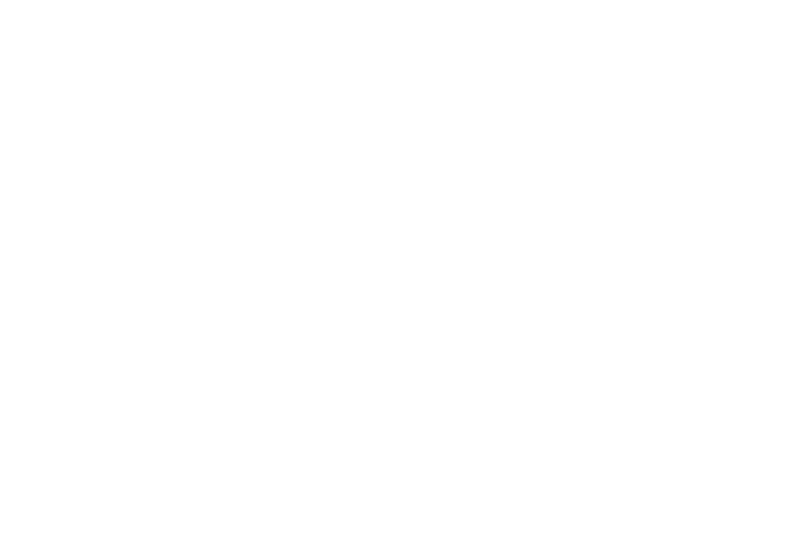

23273.840700687848
Writing figure in HTML
> Saving Results
Predicting εbreak (pct) For WLB-3 MSE is, on average = 23273.8407 and std dev of MSE = 32893.1837
Training εbreak (pct) For WLB-3 MSE is, on average = 8457.9265 and std dev of MSE = 409.8876
>> Saving traning error


In [201]:
%matplotlib inline
%matplotlib notebook 

# For εbreak (pct)
targets_to_best_performing_method = {
        'εbreak (pct)': "WLB-3", 
}

normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
    kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'ard', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True,
                      with_shortest_paths = False,
                      n_shortest_paths_features = 1200,
                      RFE_selection = False,
                      RFE_selection_n_features = 50,
                      covar_feature_selection = True,
                      concatenate_depths = True)

> Number of data points for σbreak (MPa) is 51
> With shortest paths =  True
> With concatenate depth =  False
>> Testing GraKeL kernel: WLB-5
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [17.22080515]
y_test:  [18.]
MSE of train:  17.138839650838904
index_test_is [22]
graph is 32
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [6.05357828]
y_test:  [3.8]
MSE of train:  17.56081083571783
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [28.03000015]
y_test:  [17.8]
MSE of train:  

y_pred  [9.83478735]
y_test:  [13.6]
MSE of train:  16.602604293801704
index_test_is [4]
graph is 13
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [2.66323343]
y_test:  [4.]
MSE of train:  17.23933632167028
index_test_is [34]
graph is 53
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [26.59322675]
y_test:  [7.8]
MSE of train:  12.625528114275086
index_test_is [14]
graph is 23
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  549
length before selection: 1749
length after selection: 1239
>> Performing REF selection for  900  features.
y_pred  [20.77902191]
y_test:  [9.]
MSE of train:  13.175092778200176
index_test_is [31]
graph 

<IPython.core.display.Javascript object>


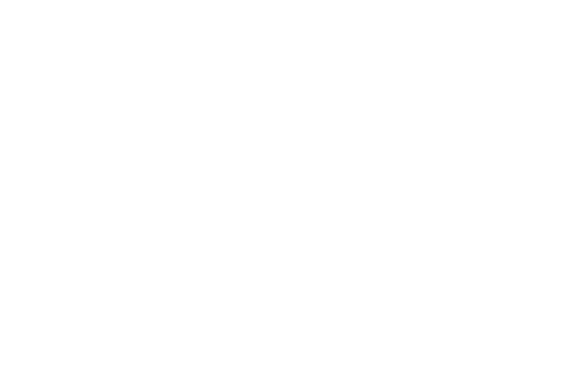

42.11670477029537
Writing figure in HTML
> Saving Results
Predicting σbreak (MPa) For WLB-5 MSE is, on average = 42.1167 and std dev of MSE = 78.1064
Training σbreak (MPa) For WLB-5 MSE is, on average = 16.6273 and std dev of MSE = 1.2434
>> Saving traning error


In [135]:
# For σbreak (MPa) 
targets_to_best_performing_method = {
        'σbreak (MPa)': "WLB-5", 
}

normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
    kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'bayes', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True,
                      with_shortest_paths = True,
                      n_shortest_paths_features = 1200,
                      RFE_selection = True,
                      RFE_selection_n_features = 900,
                      covar_feature_selection = True,
                      concatenate_depths = False)

> Number of data points for σbreak (MPa) is 51
> With shortest paths =  False
> With concatenate depth =  True
>> Testing GraKeL kernel: WLB-5
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [22]
graph is 32
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [49]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [26]
graph is 36
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 13

index_test_is [15]
graph is 24
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [5]
graph is 14
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [11]
graph is 20
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [9]
graph is 18
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [8]
graph is 17
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  1320
length before selection: 1320
length after selection: 110
index_test_is [12]
graph is 21
>>> Getting Explicit Vectors from Kernel
>>>> Pickle

<IPython.core.display.Javascript object>


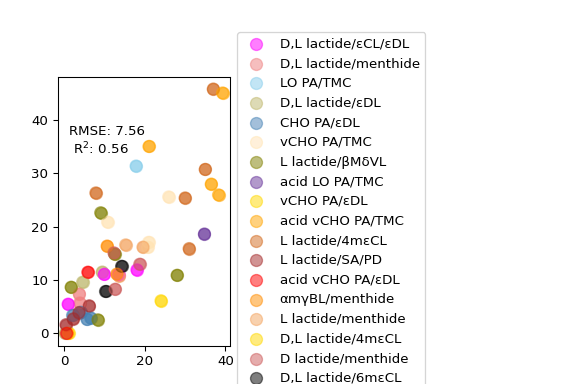

57.07832648419511


TypeError: text() missing 2 required positional arguments: 'y' and 's'

In [104]:
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
    kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'ard', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = False,
                      with_shortest_paths = False,
                      n_shortest_paths_features = 1200,
                      RFE_selection = False,
                      RFE_selection_n_features = 50,
                      covar_feature_selection = True,
                      concatenate_depths = True)

> Number of data points for Tg is 65
> With shortest paths =  True
> With concatenate depth =  False
>> Testing GraKeL kernel: WLB-3
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-21.25966888]
y_test:  [-21.]
MSE of train:  1.432375279593697
index_test_is [51]
graph is 58
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-11.59979084]
y_test:  [-12.]
MSE of train:  1.4617518073331763
index_test_is [55]
graph is 72
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-46.44096142]
y_test:  [-42.]
MSE of train:  

y_pred  [-14.3451895]
y_test:  [-14.]
MSE of train:  1.456388194431122
index_test_is [56]
graph is 73
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-11.1850791]
y_test:  [-13.]
MSE of train:  1.4378930952181266
index_test_is [54]
graph is 71
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-40.41113545]
y_test:  [-44.]
MSE of train:  1.355108055293142
index_test_is [49]
graph is 54
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-51.14127758]
y_test:  [-49.]
MSE of train:  1.3737532636950303
index_test_is

y_pred  [-48.79427903]
y_test:  [-50.]
MSE of train:  1.4583206486120885
index_test_is [62]
graph is 83
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-42.77097385]
y_test:  [-43.]
MSE of train:  1.4656911861007424
index_test_is [1]
graph is 1
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-20.69192232]
y_test:  [-21.]
MSE of train:  1.4649180319219448
index_test_is [16]
graph is 16
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
length before selection: 1434
length after selection: 1266
>> Performing REF selection for  1000  features.
y_pred  [-41.77016597]
y_test:  [-43.]
MSE of train:  1.4260862950340019
index_test_

<IPython.core.display.Javascript object>


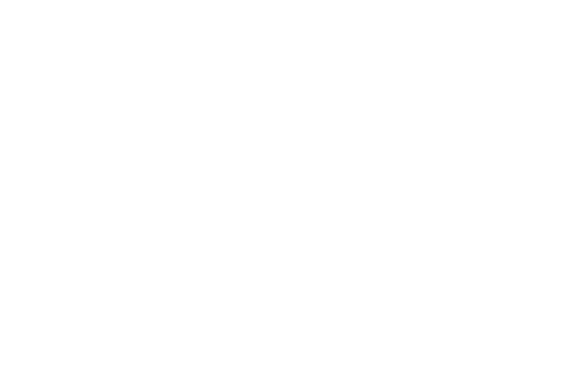

5.056163185978655
Writing figure in HTML
> Saving Results
Predicting Tg For WLB-3 MSE is, on average = 5.0562 and std dev of MSE = 11.593
Training Tg For WLB-3 MSE is, on average = 1.4168 and std dev of MSE = 0.0989
>> Saving traning error


In [136]:
# For Tg 
targets_to_best_performing_method = {
        'Tg': "WLB-3", 
}

normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
    kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'bayes', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True,
                      with_shortest_paths = True,
                      n_shortest_paths_features = 1200,
                      RFE_selection = True,
                      RFE_selection_n_features = 1000,
                      covar_feature_selection = True,
                      concatenate_depths = False)

> Number of data points for Tg2 is 59
> With shortest paths =  False
> With concatenate depth =  True
>> Testing GraKeL kernel: WLB-3
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [100.26866911]
y_test:  [100.]
MSE of train:  18.22902499952766
index_test_is [49]
graph is 71
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [37.58098067]
y_test:  [38.]
MSE of train:  18.21922798319098
index_test_is [2]
graph is 2
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [41.58744863]
y_test:  [30.]
MSE of train:  16.791550765339785
index_test_is [35]
graph is 45
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [110.44594506]
y_test:  [123.]
MSE of train:  16.87705905785672
index_test_is [47]
graph is 69
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vec

y_pred  [113.45317393]
y_test:  [110.]
MSE of train:  18.085602877325577
index_test_is [58]
graph is 88
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [48.23194386]
y_test:  [52.]
MSE of train:  18.162690213033567
index_test_is [20]
graph is 25
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [48.37321688]
y_test:  [50.]
MSE of train:  18.20278688574553
index_test_is [25]
graph is 31
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [35.86996547]
y_test:  [39.]
MSE of train:  18.06630647444965
index_test_is [6]
graph is 6
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [171.26102437]
y_test:  [175.]
MSE of train:  18.220452717045692
index_test_is [45]
graph is 57
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [36.87692699

<IPython.core.display.Javascript object>


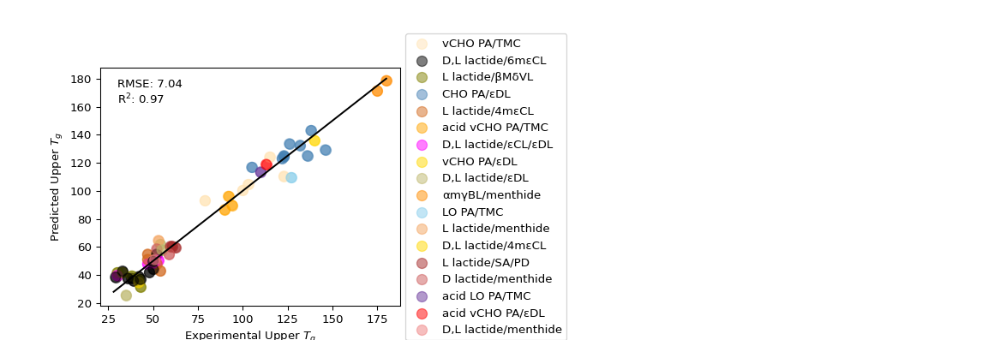

49.57902262022579
Writing figure in HTML
> Saving Results
Predicting Tg2 For WLB-3 MSE is, on average = 49.579 and std dev of MSE = 67.1184
Training Tg2 For WLB-3 MSE is, on average = 17.7211 and std dev of MSE = 0.7779
>> Saving traning error


In [137]:
%matplotlib inline
%matplotlib notebook 

# For Upper Tg 
targets_to_best_performing_method = {
        'Tg2': "WLB-3", 
}
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
    kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'bayes', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True,
                      with_shortest_paths = False,
                      n_shortest_paths_features = 1200,
                      RFE_selection = False,
                      RFE_selection_n_features = 150,
                      covar_feature_selection = False,
                      concatenate_depths = True)

> Number of data points for εbreak (pct) is 53
> With shortest paths =  False
> With concatenate depth =  True
>> Testing GraKeL kernel: WLB-1
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [851.6171234]
y_test:  [1720.]
MSE of train:  143118.3182366479
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [441.36991368]
y_test:  [872.]
MSE of train:  152710.18446723654
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [613.79839347]
y_test:  [1235.]
MSE of train:  127190.74873260154
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [1880.8439534]
y_test:  [1097.]
MSE of train:  118394.9288448881
index_test_is [32]
graph is 51
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension o

y_pred  [1712.46963296]
y_test:  [2748.]
MSE of train:  145554.8147146588
index_test_is [50]
graph is 83
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [1874.28808882]
y_test:  [1360.]
MSE of train:  121568.60618681242
index_test_is [1]
graph is 10
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [861.10546939]
y_test:  [895.]
MSE of train:  151008.90627858922
index_test_is [16]
graph is 25
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [1515.3673928]
y_test:  [1880.]
MSE of train:  148491.92170426415
index_test_is [0]
graph is 9
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [1805.24995717]
y_test:  [1200.]
MSE of train:  125565.92834293348
index_test_is [15]
graph is 24
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  36
y_pred  [468

<IPython.core.display.Javascript object>


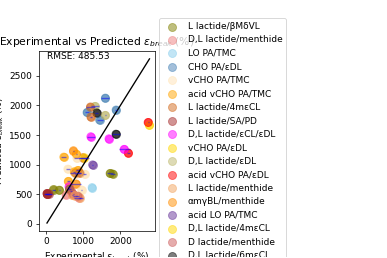

235737.12783478305
Writing figure in HTML
> Saving Results
Predicting εbreak (pct) For WLB-1 MSE is, on average = 235737.1278 and std dev of MSE = 302850.1139
Training εbreak (pct) For WLB-1 MSE is, on average = 145002.7482 and std dev of MSE = 11023.5548
>> Saving traning error
>> Testing GraKeL kernel: WLB-2
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [1623.63393333]
y_test:  [1720.]
MSE of train:  25147.742843783195
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [549.33780567]
y_test:  [872.]
MSE of train:  23669.569430955744
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [1273.5017125]
y_test:  [1235.]
MSE of train:  25033.45673394919
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151

y_pred  [813.70270291]
y_test:  [667.]
MSE of train:  23425.862922225795
index_test_is [7]
graph is 16
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [2645.21782891]
y_test:  [2748.]
MSE of train:  23745.247705226757
index_test_is [50]
graph is 83
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [1473.52384268]
y_test:  [1360.]
MSE of train:  25206.856410865883
index_test_is [1]
graph is 10
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [460.30938496]
y_test:  [895.]
MSE of train:  22561.268599918447
index_test_is [16]
graph is 25
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  [1670.12535692]
y_test:  [1880.]
MSE of train:  25002.819626809764
index_test_is [0]
graph is 9
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  151
y_pred  

<IPython.core.display.Javascript object>


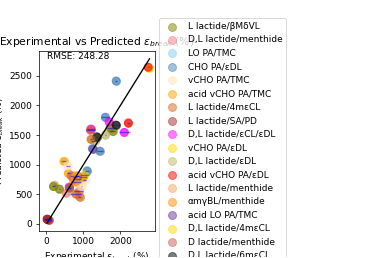

61640.89147861178
Writing figure in HTML
> Saving Results
Predicting εbreak (pct) For WLB-2 MSE is, on average = 61640.8915 and std dev of MSE = 87825.187
Training εbreak (pct) For WLB-2 MSE is, on average = 23980.4652 and std dev of MSE = 1193.2384
>> Saving traning error
>> Testing GraKeL kernel: WLB-3
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [1766.4825303]
y_test:  [1720.]
MSE of train:  8807.426540015203
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [685.6203926]
y_test:  [872.]
MSE of train:  8446.84018210302
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [1245.72621162]
y_test:  [1235.]
MSE of train:  8855.013389604537
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [

y_pred  [806.70094961]
y_test:  [667.]
MSE of train:  8576.227571832833
index_test_is [7]
graph is 16
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [2746.80513253]
y_test:  [2748.]
MSE of train:  8850.334543492692
index_test_is [50]
graph is 83
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [1344.38486019]
y_test:  [1360.]
MSE of train:  10836.438869501075
index_test_is [1]
graph is 10
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [805.28624249]
y_test:  [895.]
MSE of train:  8715.845754669139
index_test_is [16]
graph is 25
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [1988.56255229]
y_test:  [1880.]
MSE of train:  8596.841255470228
index_test_is [0]
graph is 9
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  385
y_pred  [121

<IPython.core.display.Javascript object>


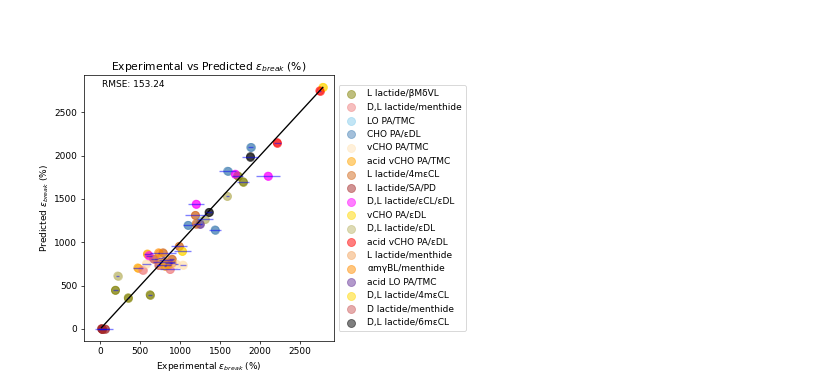

23483.080868121906
Writing figure in HTML
> Saving Results
Predicting εbreak (pct) For WLB-3 MSE is, on average = 23483.0809 and std dev of MSE = 32767.8762
Training εbreak (pct) For WLB-3 MSE is, on average = 8551.9669 and std dev of MSE = 528.3597
>> Saving traning error
>> Testing GraKeL kernel: WLB-4
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  771
y_pred  [1782.82507179]
y_test:  [1720.]
MSE of train:  9207.00300616416
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  771
y_pred  [601.68295698]
y_test:  [872.]
MSE of train:  9564.635592268747
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  771
y_pred  [1222.21596602]
y_test:  [1235.]
MSE of train:  8072.622858679956
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  771
y_pred 

KeyboardInterrupt: 

In [74]:
%matplotlib inline
%matplotlib notebook 
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
#     kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'ard', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True,
                      with_shortest_paths = False,
                      RFE_selection = False, 
                      concatenate_depths = True)

In [ ]:
%matplotlib inline
%matplotlib notebook 
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
#     kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1, 
                       kernels_to_test, 
                       learning_met = 'ard', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = False)

In [ ]:
%matplotlib inline
%matplotlib notebook 
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
#     kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'bayes', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = False,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True)

> Number of data points for εbreak (pct) is 53
> With shortest paths =  False
> With concatenate depth =  False
>> Testing GraKeL kernel: WLB-3
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
y_pred  [1673.95248889]
y_test:  [1720.]
MSE of train:  8750.110768861607
index_test_is [30]
graph is 44
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
y_pred  [677.92269361]
y_test:  [872.]
MSE of train:  8344.378786767194
index_test_is [2]
graph is 11
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
y_pred  [1084.86325786]
y_test:  [1235.]
MSE of train:  8417.983072345207
index_test_is [51]
graph is 87
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dimension of Feature Vectors:  234
y_pred  [1148.00860585]
y_test:  [1097.]
MSE of train:  8596.635642402221
index_test_is [32]
graph is 51
>>> Getting Explicit Vectors from Kernel
>>>> Pickle found
Dime

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('36,[37, 41, 101] <= 0.00', 309.3745799604531), ('41,[37, 53] <= 0.00', -287.9171048980709), ('36,[37, 52, 101] <= 0.00', -285.7447820472578), ('41,[37, 42] <= 0.00', 284.28246079782986), ('62,[54, 104, 104, 105] <= 0.00', -242.25819333210876), ('43,[53, 63] <= 0.00', -236.62556174187384), ('142,[54, 55, 79] <= 0.00', -231.3951707221714), ('54,[62, 142] <= 0.00', -224.10323045586196), ('42,[42, 43] <= 0.00', -221.0134134134448), ('43,[42, 62] <= 0.00', -215.1009427635115), ('63,[54, 104, 104, 121] <= 0.00', 174.15622366229115), ('54,[63, 142] <= 0.00', 170.72424271054854), ('104,[62, 62] <= 0.00', -163.7943880451635), ('102,[38, 81] <= 0.00', 151.61364568413762), ('38,[41, 41, 102] <= 0.00', 136.7226358651353), ('42,[42, 44] <= 0.00', -126.824398626061), ('36,[36, 41, 103] <= 0.00', 119.4183479886898), ('70,[44, 105] <= 0.00', -116.17746152284786), ('103,[36, 92] <= 0.00', 115.52076530036095), ('92,[103, 109, 114, 114] <= 0.00', 113.58629969988762), ('44,[42, 70] <= 0.00', -107.54288

101,[38, 62]
101,[38, 62]
738
20
node:  738
graph:  20
graph's database number:  30
graph's database name:  D,L lactide/εCL/εDL
O=C([C][C])O[C]([C][C])[C][C]
('121,[63, 97] <= 0.00', 97.9294416813305)
121,[63, 97]
97.9294416813305
index of tests:  [6]
pattern not found in test graphs
121,[63, 97]
121,[63, 97]
7699
0
node:  7699
graph:  0
graph's database number:  9
graph's database name:  D,L lactide/6mεCL
O=C([C][C])O[CS](C([O])=O)[C]
('76,[45] <= 0.00', -95.4706560073293)
76,[45]
-95.4706560073293
index of tests:  [6]
pattern not found in test graphs
76,[45]
76,[45]
743
20
node:  743
graph:  20
graph's database number:  30
graph's database name:  D,L lactide/εCL/εDL
[C][C][C][C]
('38,[41, 41, 101] <= 0.00', -94.43189823254318)
38,[41, 41, 101]
-94.43189823254318
index of tests:  [6]
pattern not found in test graphs
38,[41, 41, 101]
38,[41, 41, 101]
739
20
node:  739
graph:  20
graph's database number:  30
graph's database name:  D,L lactide/εCL/εDL
O=C([C])O[C]([C][C][C])[C][C][C]
('

<IPython.core.display.Javascript object>


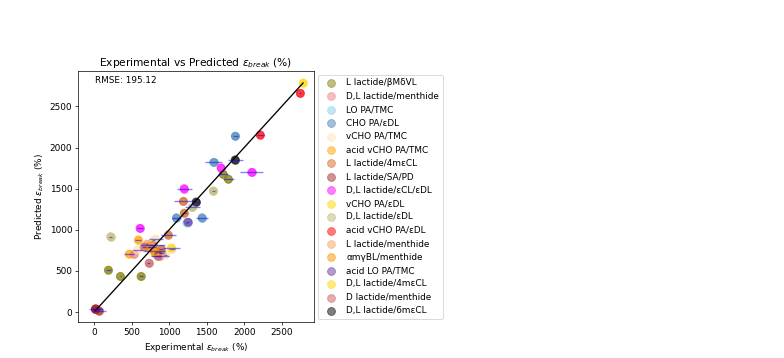

38070.901961201715
Writing figure in HTML
> Saving Results
Predicting εbreak (pct) For WLB-3 MSE is, on average = 38070.902 and std dev of MSE = 73279.912
Training εbreak (pct) For WLB-3 MSE is, on average = 8328.7631 and std dev of MSE = 482.6765
>> Saving traning error


In [56]:
%matplotlib inline
%matplotlib notebook 
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
#     kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1,                               
                       kernels_to_test, 
                       learning_met = 'bayes', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = True,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False, 
                      printing_results = True)

In [ ]:
# targets_to_best_performing_weight = {
#     'Tg': 0.2,  
#     'Tg2': 0.2,  
#     'σbreak (MPa)': 0.1, 
#     'εbreak (pct)': 0.005
# }


%matplotlib inline
%matplotlib notebook 
normalise_explicit_vectors = True
for t in targets_to_best_performing_method:
    target = df[t]  
    target_var = df_var[t]
#     kernels_to_test = [targets_to_best_performing_method[t]]
    NORMALIZING_GRAPH_KERNELS = False
#     for w_var_train in np.linspace(0, 1, num=11):
#         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
    w_var_train = 0.4
    run_kernels_against_target(df, 
                       target, 
                       target_var,
                       Graphs, 
                       1, 
                       kernels_to_test, 
                       learning_met = 'gp-scikit', 
                       explicit_features = True, 
                       normalise = False, 
                       explanation = True,
                       extra_tests = [],
                       visualisation = True,
                        show_error_bars = True,
                      training_error= True,
#                                weight_y_var_train = 0.005,
                     weight_y_var_train = w_var_train,
                       weight_y_var_train_for_tg_and_tg2 = w_var_train,
                      truncate_to_zero_if_neg = True,
                      log_y = False)

In [ ]:
for h_block in ['PA CHO', 'PA vCHO', 'PA acid vCHO']:
    break_after_this = False # To break vefore the end. 
    if is_hard_block[h_block] == 0: # Check if it is hard block. If not, go to next. 
        continue
    for s_block in ['4-methyl-ε-caprolactone',  'epsilon decalactone', '6-methyl-ε-caprolactone', 'PTMC']:
        if is_hard_block[s_block] == 1: # Check if it is soft block. If not, go to next.
            continue
#         h_block = 'PA vCHO'
#         s_block = 'PTMC'
        
#         h_block = 'L lactide'
#         s_block = '4-methyl-ε-caprolactone'
        
#         break_after_this = False
        
#         h_block = 'D,L lactide'
# #         h_block = 'PA CHO'
#         s_block = '6-methyl-ε-caprolactone'
        print('Soft Block:', s_block, ' ', smiles_of_monomer[s_block])
        print('Hard Block:', h_block, ' ', smiles_of_monomer[h_block])
        #     combination_of_repeat_units = '{' + smiles_of_monomer[h_block] + '}{' + smiles_of_monomer[s_block] + '}{' + smiles_of_monomer[h_block] + '}'

        combination_of_repeat_units = '{' + smiles_of_monomer[h_block] + '}{' + smiles_of_monomer[s_block] + '}{' + smiles_of_monomer[h_block] + '}'

        print(combination_of_repeat_units)

        hard_blocks = 150  # These are the outer blocks
#         soft_blocks = 800  # These are the inner blocks
        soft_blocks = 1700  # These are the inner blocks


        # test_smiles = [combination_of_repeat_units, combination_of_repeat_units] 
        # block_ratios_to_test = ['19:675:19', '38:475:38']
        # null_ratios = [False, False]


        test_smiles = [] 
        block_ratios_to_test = []
        null_ratios = []
        for i in range(10, hard_blocks, 10):
            for j in range(50, soft_blocks, 50):
                block_ratios_to_test.append(str(i) + ':' + str(j) + ':' + str(i))
                test_smiles.append(combination_of_repeat_units)
                null_ratios.append(False)
#         print(block_ratios_to_test)

        print(">>> Getting Full Polymer for ", h_block, " and, ", s_block)
        param = str(h_block) +  str(s_block) +  str(hard_blocks) +  str(soft_blocks) + str(len(block_ratios_to_test))
        try:
            full_pols_test = pickle.load(open('{0}.pickle'.format(param), "rb"))
            print(">>>> Pickle found")
        except (OSError, IOError) as e:
            print(">>>> Pickle not found, recomputing")
            full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios)
            pickle.dump(full_pols_test, open('{0}.pickle'.format(param), "wb"))

#         full_pols_test = from_smiles_to_networkx(test_smiles, block_ratios_to_test, null_ratios)
        
        grakel_pols_extra = graph_from_networkx(full_pols_test, node_labels_tag='element', edge_weight_tag ='order', as_Graph = False)


        #  Getting a list of them rather than an itearable. 

        # G = grakel_pols
        Graphs_extra = []
        for g in grakel_pols_extra:
            Graphs_extra.append(g)
        Graphs_extra

        targets_to_best_performing_method = {
            'Tg': "WLB-4",  
            'Tg2': "WLB-4",  
            'σbreak (MPa)': "WLB-3", 
            'εbreak (pct)': "WLB-4", 
        }

        targets_to_best_performing_weight = {
            'Tg': 0.2,  
            'Tg2': 0.2,  
            'σbreak (MPa)': 0.1, 
            'εbreak (pct)': 0.01,
        }

        normalise_explicit_vectors = True
        for t in targets_to_best_performing_method:
            target = df[t]  
            target_var = df_var[t]
            kernels_to_test = [targets_to_best_performing_method[t]]
            NORMALIZING_GRAPH_KERNELS = True
        #     for w_var_train in np.linspace(0, 0.1, num=11):
        #         for w_var_train_tg_tg2 in np.linspace(0, 0.1, num=1):
            run_kernels_against_target(df, 
                               target, 
                               target_var,
                               Graphs, 
                               1, 
                               kernels_to_test, 
                               learning_met = 'gp-scikit', 
                               explicit_features = True, 
                               normalise = False, 
                               explanation = False,
                               extra_tests = Graphs_extra,
                               visualisation = True,
                                show_error_bars = True,
                              training_error= True,
        #                        weight_y_var_train = 0.005,
                             weight_y_var_train = targets_to_best_performing_weight[t],
                               weight_y_var_train_for_tg_and_tg2 = targets_to_best_performing_weight[t], 
                              log_y = False)
        if break_after_this:
            break # We want just one test. 
    if break_after_this:
        break # We want just one test. 

In [ ]:
gk._inv_labels[0]

In [24]:
import grakel
from grakel import GraphKernel 
sp = grakel.ShortestPath()
sp.initialize()
sp.fit(Graphs)
p_input_spaths = sp.parse_input(Graphs)

In [25]:
p_input_spaths

{0: {0: 62,
  1: 1000,
  2: 248,
  3: 806,
  4: 124,
  5: 1401,
  6: 804,
  7: 486,
  8: 120,
  9: 1238,
  10: 800,
  11: 478,
  12: 121,
  13: 1231,
  14: 482,
  15: 470,
  16: 117,
  17: 1069,
  18: 474,
  19: 774,
  20: 118,
  21: 1060,
  22: 466,
  23: 770,
  24: 114,
  25: 1208,
  26: 768,
  27: 764,
  28: 114,
  29: 1356,
  30: 764,
  31: 760,
  32: 111,
  33: 1352,
  34: 758,
  35: 446,
  36: 111,
  37: 1192,
  38: 754,
  39: 438,
  40: 107,
  41: 1185,
  42: 442,
  43: 430,
  44: 107,
  45: 1026,
  46: 434,
  47: 728,
  48: 103,
  49: 1017,
  50: 426,
  51: 724,
  52: 103,
  53: 1162,
  54: 722,
  55: 718,
  56: 100,
  57: 1307,
  58: 718,
  59: 714,
  60: 100,
  61: 1303,
  62: 712,
  63: 406,
  64: 96,
  65: 1146,
  66: 708,
  67: 398,
  68: 97,
  69: 1139,
  70: 402,
  71: 390,
  72: 93,
  73: 983,
  74: 394,
  75: 682,
  76: 94,
  77: 974,
  78: 386,
  79: 678,
  80: 90,
  81: 1116,
  82: 676,
  83: 672,
  84: 90,
  85: 1258,
  86: 672,
  87: 668,
  88: 87,
  89: 1254,
  90

In [32]:
len(p_input_spaths)

67

In [26]:
sp._enum

{('O', 'CS', 1.0): 0,
 ('O', 'C', 2.0): 1,
 ('O', 'O', 4.0): 2,
 ('O', 'O', 3.0): 3,
 ('O', 'CR', 4.0): 4,
 ('O', 'C', 5.0): 5,
 ('O', 'O', 7.0): 6,
 ('O', 'O', 6.0): 7,
 ('O', 'CS', 7.0): 8,
 ('O', 'C', 8.0): 9,
 ('O', 'O', 10.0): 10,
 ('O', 'O', 9.0): 11,
 ('O', 'CR', 10.0): 12,
 ('O', 'C', 11.0): 13,
 ('O', 'O', 13.0): 14,
 ('O', 'O', 12.0): 15,
 ('O', 'CS', 13.0): 16,
 ('O', 'C', 14.0): 17,
 ('O', 'O', 16.0): 18,
 ('O', 'O', 15.0): 19,
 ('O', 'CR', 16.0): 20,
 ('O', 'C', 17.0): 21,
 ('O', 'O', 19.0): 22,
 ('O', 'O', 18.0): 23,
 ('O', 'CS', 19.0): 24,
 ('O', 'C', 20.0): 25,
 ('O', 'O', 22.0): 26,
 ('O', 'O', 21.0): 27,
 ('O', 'CR', 22.0): 28,
 ('O', 'C', 23.0): 29,
 ('O', 'O', 25.0): 30,
 ('O', 'O', 24.0): 31,
 ('O', 'CS', 25.0): 32,
 ('O', 'C', 26.0): 33,
 ('O', 'O', 28.0): 34,
 ('O', 'O', 27.0): 35,
 ('O', 'CR', 28.0): 36,
 ('O', 'C', 29.0): 37,
 ('O', 'O', 31.0): 38,
 ('O', 'O', 30.0): 39,
 ('O', 'CS', 31.0): 40,
 ('O', 'C', 32.0): 41,
 ('O', 'O', 34.0): 42,
 ('O', 'O', 33.0): 43

In [ ]:
len(sp._enum)

In [ ]:
p_input_spaths[0]

In [588]:
features_sp = np.zeros((len(p_input_spaths), len(sp._enum)))
for f in range(len(p_input_spaths)):
    print(f)
    for feature_id in (p_input_spaths[f]).keys():
#         print(feature_id)
        features_sp[f][feature_id] =p_input_spaths[f][feature_id]
features_sp

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66


array([[6.200e+01, 1.000e+03, 2.480e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [9.000e+01, 1.176e+03, 3.600e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [1.000e+02, 1.248e+03, 4.000e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [0.000e+00, 2.635e+03, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.137e+03, 3.588e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.305e+03, 3.588e+03, ..., 1.000e+00, 2.000e+00,
        1.000e+00]])

In [ ]:
param = "temp/dataset_explicit_vectors/" + "spath_enum_74_graphs_" + "all_graphs_" + "Chiral_True" 
pickle.dump(sp._enum, open('{0}.pickle'.format(param), "wb"))

In [29]:
param = "temp/dataset_explicit_vectors/" + "spath_X_74_graphs_" + "all_graphs_" + "Chiral_True" 
pickle.dump(p_input_spaths, open('{0}.pickle'.format(param), "wb"))

In [28]:
param = "temp/dataset_explicit_vectors/" + "spath_enum" + "all_graphs_" + "Chiral_True" 
pickle.dump(sp._enum, open('{0}.pickle'.format(param), "wb"))

In [ ]:
param = "temp/dataset_explicit_vectors/" + "spath_X" + "all_graphs_" + "Chiral_True" 
pickle.dump(p_input_spaths, open('{0}.pickle'.format(param), "wb"))

In [33]:
features_sp = np.zeros((len(sp.X), len(sp._enum)))
for f in range(len(sp.X)):
    print(f)
    for feature_id in (sp.X[f]).keys():
#         print(feature_id)
        features_sp[f][feature_id] = sp.X[f][feature_id]
features_sp

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66


array([[6.200e+01, 1.000e+03, 2.480e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [9.000e+01, 1.176e+03, 3.600e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [1.000e+02, 1.248e+03, 4.000e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [0.000e+00, 2.635e+03, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.137e+03, 3.588e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.305e+03, 3.588e+03, ..., 1.000e+00, 2.000e+00,
        1.000e+00]])

In [ ]:
len(features_sp[0])

In [34]:
param = "temp/dataset_explicit_vectors/" + "spath_feat" + "all_graphs_" + "Chiral_True" 
pickle.dump(features_sp, open('{0}.pickle'.format(param), "wb"))

### This is the features_sp

In [40]:
param = "temp/dataset_explicit_vectors/" + "spath_feat" + "all_graphs_" + "Chiral_True" 
features_sp = pickle.load(open('{0}.pickle'.format(param), "rb"))

In [ ]:
a = np.array([[1,1,1],[2,2,1]])

In [ ]:
a[:, [True, False, False]] 

In [ ]:
param = "temp/dataset_explicit_vectors/" + "spath_feat" + "all_graphs_" + "Chiral_True" 
sp_X = pickle.load(open('{0}.pickle'.format(param), "rb"))

In [ ]:
param = "temp/dataset_explicit_vectors/" + "spath_enum" + "all_graphs_" + "Chiral_True" 
sp_enum = pickle.load(open('{0}.pickle'.format(param), "rb"))

In [ ]:
features_sp = np.zeros((len(sp_X), len(sp_enum)))
for f in range(len(sp_X)):
    print(f)
    for feature_id in (sp_X[f]).keys():
#         print(feature_id)
        features_sp[f][feature_id] = sp_X[f][feature_id]
features_sp

In [ ]:
sp_enum

In [ ]:
features_sp = sp_X[:, 0:500]

In [ ]:
len(features_sp)

In [ ]:
features_sp

In [589]:
len(Graphs)

67

In [590]:
param = "temp/dataset_explicit_vectors/" + "spath_feat" + "67_graphs_with_87_88" + "Chiral_True" 
pickle.dump(features_sp, open('{0}.pickle'.format(param), "wb"))

In [591]:
param = "temp/dataset_explicit_vectors/" + "spath_p_input_spaths" + "67_graphs_with_87_88" + "Chiral_True" 
pickle.dump(p_input_spaths, open('{0}.pickle'.format(param), "wb"))

In [592]:
param = "temp/dataset_explicit_vectors/" + "spath_sp_enum" + "67_graphs_with_87_88" + "Chiral_True" 
pickle.dump(sp._enum, open('{0}.pickle'.format(param), "wb"))

In [593]:
features_sp = features_sp[:, 0:500]

In [128]:
param = "temp/dataset_explicit_vectors/" + "spath_feat" + "67_graphs_with_87_88" + "Chiral_True_2" 
features_sp = pickle.load(open('{0}.pickle'.format(param), "rb"))

In [129]:
features_sp

array([[6.200e+01, 1.000e+03, 2.480e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [9.000e+01, 1.176e+03, 3.600e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [1.000e+02, 1.248e+03, 4.000e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [0.000e+00, 2.635e+03, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.137e+03, 3.588e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 6.305e+03, 3.588e+03, ..., 1.000e+00, 2.000e+00,
        1.000e+00]])

In [108]:
import pandas as pd
from rdkit.Chem import PandasTools
from rdkit.Chem import Draw

In [109]:
filename = 'Tg2_importances.csv'
esol_data = pd.read_csv(filename)
esol_data = esol_data.dropna()
esol_data

AttributeError: module 'pandas.io.formats.format' has no attribute '_get_adjustment'

      change                        smiles
0  -9.696224          [O]C(=O)O[C]([C])[C]
1   5.487840           O=C(C([C])=[C])O[C]
2   4.829383                      O=[C][C]
3   4.759058               O=[C]C([C])=[C]
4   4.607716     O=[C]C(C(=[C])[C])=[C][C]
5   3.531611  [O]C(=O)C(C([C])=[C])=[C][C]
6   3.502146     [O][C]([C][C])[C]([O])[C]
7   3.404023                [O][C]([C])[C]
8   3.229315          [C]C([C])=[C][C]=[C]
9   3.057334             [C]=[C][C]=[C][C]
10  2.917774     [O][C]([C])[C][C]([C])[C]
11  2.779117    [O][C]([C])[C](O[C])[C][C]
12 -2.450439                   O=C([C])[O]
13 -2.174631             [S][C][C]C([O])=O
14 -2.109517          [S][C][C][C]([C])[C]
15 -2.069941                 [C][C]S[C][C]

In [113]:
PandasTools.AddMoleculeColumnToFrame(esol_data, smilesCol='smiles')
esol_data.head(1)


AttributeError: module 'pandas.io.formats.format' has no attribute '_get_adjustment'

     change                smiles  \
0 -9.696224  [O]C(=O)O[C]([C])[C]   

                                               ROMol  
0  <img data-content="rdkit/molecule" src="data:i...  

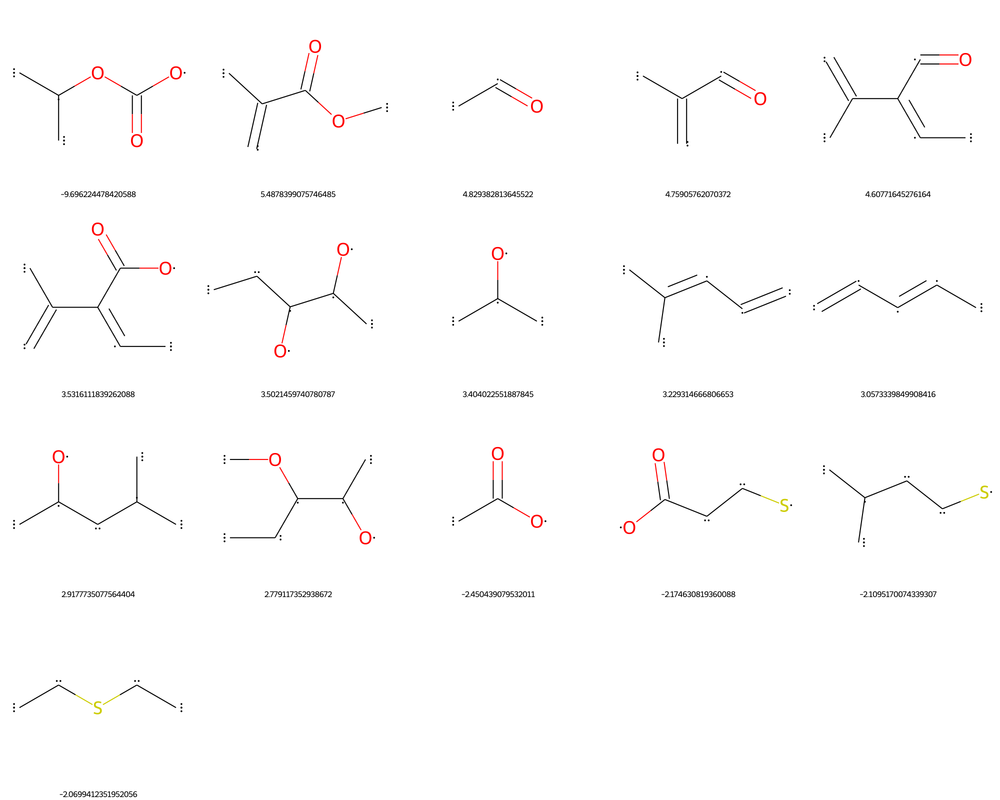

In [114]:
PandasTools.FrameToGridImage(esol_data.head(100), legendsCol="change", molsPerRow=5, subImgSize=(400, 400))


In [112]:

mols = [Chem.MolFromSmiles(smi) for smi in esol_data.smi]

AttributeError: 'DataFrame' object has no attribute 'smi'

In [33]:
mols

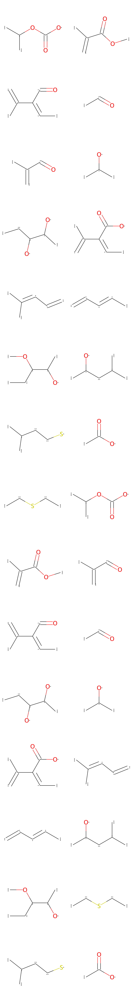

In [41]:
Draw.MolsToGridImage(mols, molsPerRow=2, subImgSize=(400, 400))


In [121]:
filename = 's_break_importances.csv'
esol_data = pd.read_csv(filename)
esol_data = esol_data.dropna()
esol_data

AttributeError: module 'pandas.io.formats.format' has no attribute '_get_adjustment'

      change                        smiles
0   4.131607          [O]C(=O)O[C]([C])[C]
1   1.642962                 O=C(O[C])O[C]
2   1.638079               [O][C][C][C][O]
3   1.599591                   [O]C([O])=O
4   1.598463               O=C([O])O[C][C]
5   1.526746                 [C]O[C][C][C]
6   1.295801          [C][C][C][C]([C])[C]
7   1.183092          [S][C][C][C]([C])[C]
8   1.161338                 [C][C]S[C][C]
9   1.048216                   O=C([C])[O]
10  0.899600                 [C][C][C]S[C]
11  0.878716  [O]C(=O)C(C([C])=[C])=[C][C]
12  0.704229             [C]=[C][C]=[C][C]
13  0.698758          [C]C([C])=[C][C]=[C]
14  0.573103    [O][C]([C])[C](O[C])[C][C]

In [122]:
PandasTools.AddMoleculeColumnToFrame(esol_data, smilesCol='smiles')
esol_data.head(1)

AttributeError: module 'pandas.io.formats.format' has no attribute '_get_adjustment'

     change                smiles  \
0  4.131607  [O]C(=O)O[C]([C])[C]   

                                               ROMol  
0  <img data-content="rdkit/molecule" src="data:i...  

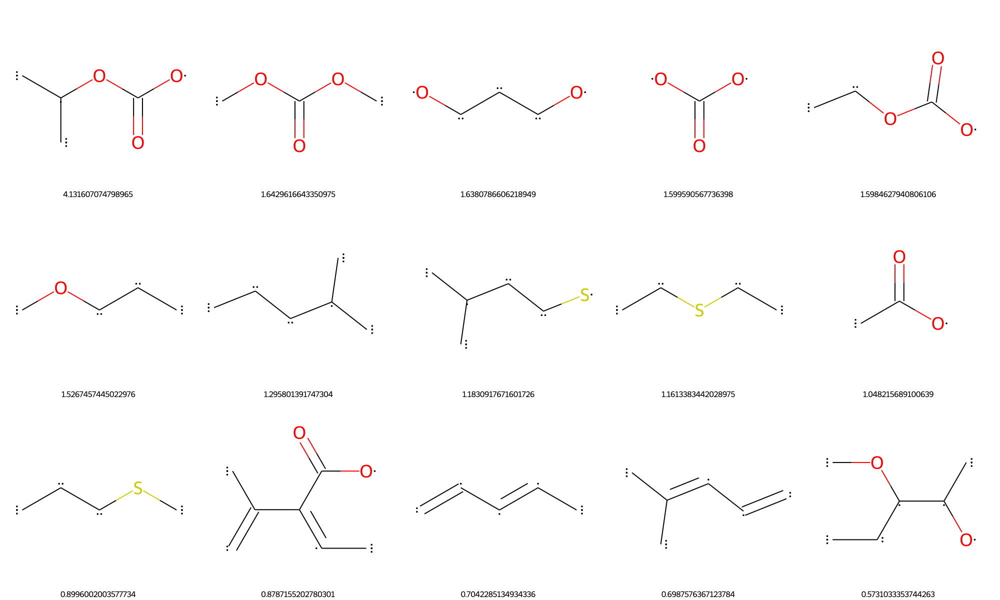

In [123]:
PandasTools.FrameToGridImage(esol_data.head(100), legendsCol="change", molsPerRow=5, subImgSize=(400, 400))


<IPython.core.display.Javascript object>


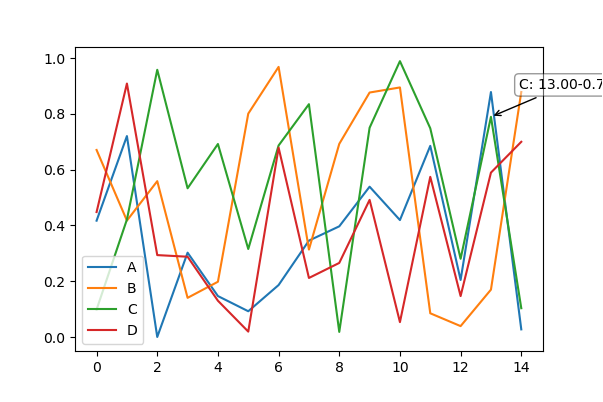

In [384]:
np.random.seed(1)
y = np.random.rand(4, 15)
x = [np.arange(15) for i in range(len(y))]
names = np.array(list("ABCD"))
fig, ax = plt.subplots()
lines = []
for i in range(len(names)):
    l, = ax.plot(x[i], y[i], label=names[i])
    lines.append(l)

annot = ax.annotate("", xy=(0, 0), xytext=(20, 20), textcoords="offset points",
                    bbox=dict(boxstyle="round", fc="w"),
                    arrowprops=dict(arrowstyle="->"))
annot.set_visible(False)

ax.legend()
def update_annot(line, idx):
    posx, posy = [line.get_xdata()[idx], line.get_ydata()[idx]]
    annot.xy = (posx, posy)
    text = f'{line.get_label()}: {posx:.2f}-{posy:.2f}'
    annot.set_text(text)
    # annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
    annot.get_bbox_patch().set_alpha(0.4)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        for line in lines:
            cont, ind = line.contains(event)
            if cont:
                update_annot(line, ind['ind'][0])
                annot.set_visible(True)
                fig.canvas.draw_idle()
            else:
                if vis:
                    annot.set_visible(False)
                    fig.canvas.draw_idle()


fig.canvas.mpl_connect("motion_notify_event", hover)
plt.show()

In [696]:
import math

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import hsv


def generate_colormap(number_of_distinct_colors: int = 80):
    if number_of_distinct_colors == 0:
        number_of_distinct_colors = 80

    number_of_shades = 7
    number_of_distinct_colors_with_multiply_of_shades = int(math.ceil(number_of_distinct_colors / number_of_shades) * number_of_shades)

    # Create an array with uniformly drawn floats taken from <0, 1) partition
    linearly_distributed_nums = np.arange(number_of_distinct_colors_with_multiply_of_shades) / number_of_distinct_colors_with_multiply_of_shades

    # We are going to reorganise monotonically growing numbers in such way that there will be single array with saw-like pattern
    #     but each saw tooth is slightly higher than the one before
    # First divide linearly_distributed_nums into number_of_shades sub-arrays containing linearly distributed numbers
    arr_by_shade_rows = linearly_distributed_nums.reshape(number_of_shades, number_of_distinct_colors_with_multiply_of_shades // number_of_shades)

    # Transpose the above matrix (columns become rows) - as a result each row contains saw tooth with values slightly higher than row above
    arr_by_shade_columns = arr_by_shade_rows.T

    # Keep number of saw teeth for later
    number_of_partitions = arr_by_shade_columns.shape[0]

    # Flatten the above matrix - join each row into single array
    nums_distributed_like_rising_saw = arr_by_shade_columns.reshape(-1)

    # HSV colour map is cyclic (https://matplotlib.org/tutorials/colors/colormaps.html#cyclic), we'll use this property
    initial_cm = hsv(nums_distributed_like_rising_saw)

    lower_partitions_half = number_of_partitions // 2
    upper_partitions_half = number_of_partitions - lower_partitions_half

    # Modify lower half in such way that colours towards beginning of partition are darker
    # First colours are affected more, colours closer to the middle are affected less
    lower_half = lower_partitions_half * number_of_shades
    for i in range(3):
        initial_cm[0:lower_half, i] *= np.arange(0.2, 1, 0.8/lower_half)

    # Modify second half in such way that colours towards end of partition are less intense and brighter
    # Colours closer to the middle are affected less, colours closer to the end are affected more
    for i in range(3):
        for j in range(upper_partitions_half):
            modifier = np.ones(number_of_shades) - initial_cm[lower_half + j * number_of_shades: lower_half + (j + 1) * number_of_shades, i]
            modifier = j * modifier / upper_partitions_half
            initial_cm[lower_half + j * number_of_shades: lower_half + (j + 1) * number_of_shades, i] += modifier

    return ListedColormap(initial_cm)